In [0]:
!pip install keras-resnet
!pip install googledrivedownloader
%tensorflow_version 1.4.1

  Created wheel for keras-resnet: filename=keras_resnet-0.2.0-py2.py3-none-any.whl size=20487 sha256=aae7d0575fa609980531a19331efd03ff8516b43fa05ac7c634d224a4296f841
  Stored in directory: /root/.cache/pip/wheels/5f/09/a5/497a30fd9ad9964e98a1254d1e164bcd1b8a5eda36197ecb3c
Successfully built keras-resnet
`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `1.4.1`. This will be interpreted as: `1.x`.


TensorFlow 1.x selected.


In [0]:
from google_drive_downloader import GoogleDriveDownloader as gdd
#https://drive.google.com/open?id=1rxqsRITQ5GqFdjOjNbdc2yOGQUTVL_0r
gdd.download_file_from_google_drive(file_id='1rxqsRITQ5GqFdjOjNbdc2yOGQUTVL_0r',
                                    dest_path='./packages.zip',
                                    unzip=True)

Unzipping...Done.


In [0]:
ls

packages.zip  sample_data/  test_2_full.p  train_2_full.p


In [0]:

import pickle

# open a file, where you stored the pickled data
file = open('train_2_full.p', 'rb')

# dump information to that file
train_set = pickle.load(file)

# close the file
file.close()

# open a file, where you stored the pickled data
file = open('test_2_full.p', 'rb')

# dump information to that file
test_set = pickle.load(file)

# close the file
file.close()


In [0]:
for key in train_set:
  print(len(train_set[key]['cycle']))

6
8
9
9
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
9
9
9
9
9
9
9
8
15
7
7
7
16
8
9
17
12
10
9
9
7
7
7
7
7
24
4
4
7
5
19
20
33
30
21
6
8
6
6
6
6
7
6
5
5
5
6
10
5
9
7
7
7
7
7
7
7
6
6
6
6
6
6
6
7
7
7
7
7
7
8
8
8
8
8
8
8
8
9
9
9
9
9
9
9
9
9
9
9
9
10
11
11
11
11
11
11
6
5
5
5
5
5
7
7
7
7
7
7
7
7
7
8
8
8
8
11
9
10
5
5
7
7
6
9
9
9
9
8
8
7
8
9
9
9
9
9
8
9
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
7
7
7
7
7
7
7
11
10
9
10
5
6
5
6
5
5
5
6
9
11
7
9
12
12
12
12
12
12
12
7
7
7
7
7
7
7
5
5
5
10
10
10
10
10
10
6
6
6
6
9
9
9
8
8
8
15
12
9
13
15
11
8
8
8
8
8
8
8
9
9
9
9
9
9
9
9
9
9
9
9
9
9
12
12
12
9
12
9
9
10
3
3
3
3
3
3
3
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
5
5
5
5
5
5
5
6
6
6
6
6
6
10
17
25
25
24
24
13
15
7
7
7
7
7
7
7
7
6
6
6
6
6
6
6
7
7
7
7
7
7
7
6
6
6
6
6
6
8
7
6
6
6
6
6
4
4
4
5
4
4
8
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
6
6
6
6
6
6
15
17
14
16
5
4
8
8
8
8
8
8
8
7
7
12
12
12
12
12
12
10
8
8
8
8
8
8
8
6
3
5
9
9
5
5
5
5
5
5
3
3
3
3
3
3
5
5
5
5
5
5
4
4
4
4
4
7
7
7
7
6
7
10
10
10
10
10
10
10
10
10
10
10
9


In [0]:
def spectrogram(samples, sample_rate, stride_ms = 10.0, 
                          window_ms = 20.0, max_freq = None, eps = 1e-14):

    stride_size = int(0.001 * sample_rate * stride_ms)
    window_size = int(0.001 * sample_rate * window_ms)

    # Extract strided windows
    truncate_size = (len(samples) - window_size) % stride_size
    samples = samples[:len(samples) - truncate_size]
    nshape = (window_size, (len(samples) - window_size) // stride_size + 1)
    nstrides = (samples.strides[0], samples.strides[0] * stride_size)
    windows = np.lib.stride_tricks.as_strided(samples, 
                                          shape = nshape, strides = nstrides)
    
    assert np.all(windows[:, 1] == samples[stride_size:(stride_size + window_size)])

    # Window weighting, squared Fast Fourier Transform (fft), scaling
    weighting = np.hanning(window_size)[:, None]
    
    fft = np.fft.rfft(windows * weighting, axis=0)
    fft = np.absolute(fft)
    fft = fft**2
    
    scale = np.sum(weighting**2) * sample_rate
    fft[1:-1, :] *= (2.0 / scale)
    fft[(0, -1), :] /= scale
    
    # Prepare fft frequency list
    freqs = float(sample_rate) / window_size * np.arange(fft.shape[0])
    
    # Compute spectrogram feature
    ind = np.where(freqs <= max_freq)[0][-1] + 1
    specgram = np.log(fft[:ind, :] + eps)
    return specgram

In [0]:
import matplotlib.pyplot as plt
import IPython.display as disp
import numpy as np
import librosa
import librosa.display
import io
import matplotlib
from scipy import fft      
import cv2
#matplotlib.use('Agg')
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt

import math
import os
import io
import random
from pylab import plot,show,subplot,specgram
import gc
from google.colab.patches import cv2_imshow

temp = None
segment_lenght_s = 5
last_index = 20000

extracted = []
masks = []
figwidth = 20 ; figheight = 12



def return_melspectogram(data,samplerate):
    # Average the stereo signal
    
    data = np.asarray(data)


    # Set up the plot
    image_buffer = io.BytesIO()
        
    image_buffer.seek(0)
    #fig = plt.figure(figsize=(1,1), dpi=128, frameon=False)
    axes = plt.axes()
    axes.get_xaxis().set_visible(False)

    axes.get_yaxis().set_visible(False)
    #fig.axes.get_xaxis().set_visible(False)

    #fig.axes.get_yaxis().set_visible(False)
    
    Z = librosa.feature.melspectrogram(y=data, sr=samplerate,n_mels=1000,hop_length=4)
    Z = librosa.power_to_db(Z, ref=np.max)
    #plt.imsave('ci.png',Z,format="png", dpi=500)
    plt.imsave('ci.png',Z,format="png")
    plt.close()
    f = plt.figure()
    f.clear()
    plt.close(f)
    plt.close('all')
    im = cv2.imread('ci.png')
    im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    print(im.shape)
    #im_resized = cv2.resize(im, (128, 128), interpolation=cv2.INTER_LINEAR)
    
    gc.collect()
    return im


def create_spect(signal):
    fig, ax = plt.subplots()
    # Set the number of samples for each spectral slice
    # Adjust the number for narrow-band or broad-band spectrogram
    temp = signal
    ax.specgram(temp, NFFT=int(4000/15.0), Fs=4000)
    #librosa.display.specshow(temp, x_axis='time', y_axis='mel', sr=4000,fmax=1000)
    #plt.imsave('ci.png',Z,format="png", dpi=500)
    
    #librosa.feature.melspectrogram(y=temp, sr=4000)
    plt.axis(ymin=0, ymax=2000)
    ax.set_axis_off()
    
    ax.legend().remove();
    ax.legend().set_visible(False)
    
    # Set up the plot
   
    plt.savefig('ci.png', bbox_inches='tight', pad_inches=0.0, dpi=500)
    f = plt.figure()
    f.clear()
    plt.close(f)
    plt.close('all')
    im = cv2.imread('ci.png')
    im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    return im

def create_mask(mask,computed):
  print(mask.shape)
  print(computed.shape)
  
  idx = np.where(mask == 1.0)
  #for ida in idx[0]:
  #  mask[ida-50:ida+50,0] = 1.0

  idx = np.where(mask == 0.0)
  mask[idx] = -1.0
    
  #ma[:,idx] = 1.0
  fig, ax = plt.subplots()
    # Set the number of samples for each spectral slice
    # Adjust the number for narrow-band or broad-band spectrogram
  ax.plot(mask,linewidth=5)
    
  plt.axis(ymin=0, ymax=1)
  ax.set_axis_off()
    
  ax.legend().remove();
  ax.legend().set_visible(False)
    
    # Set up the plot
   
  plt.savefig('ci2.png', bbox_inches='tight', pad_inches=0.0, dpi=500)
  f = plt.figure()
  f.clear()
  plt.close(f)
  plt.close('all')
  im2 = cv2.imread('ci2.png')
  im3 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
  (thresh, im4) = cv2.threshold(im3, 150, 255, cv2.THRESH_BINARY)
  im4 = np.invert(im4)

  return im4

train = train_set
test = test_set
for key in train:
  if 'filtered' in train[key]:

    filtered = train[key]['filtered']
    #mask = train[key]['mask']

    cycles = train[key]['cycle']
    cycles = np.asarray(cycles)
    idx = cycles[:,1]
    
    
    
    temp = np.array(filtered[0:last_index],dtype=float)

    mask = np.zeros((temp.shape[0]))
    for id in idx:
      pos = int(id*4000)
      if len(mask) > pos:
        mask[pos] = 1.0
    #mfccs = librosa.feature.mfcc(y=temp, sr=4000, n_mfcc=128)
    #S = np.abs(fft(temp))
    #S = S/np.max(S)
    im = create_spect(temp)
    #im = return_melspectogram(temp,4000)
    #cv2_imshow(im)
   
    im2 = create_mask(mask,im)
    im = cv2.resize(im,(256,128),interpolation=cv2.INTER_LINEAR)
    im2 = cv2.resize(im2,(256,128),interpolation=cv2.INTER_LINEAR)
    
    #cv2_imshow(im)
    #cv2_imshow(im2)
    #break
    
    extracted.append(im)
    masks.append(im2)
    #plt.plot(S)
    #plt.plot(np.array(mask[0:last_index],dtype=float))
    #plt.show()



#print(extracted.shape)
#print(masks.shape)

test_extracted = []
test_masks  = []
for key in test:
  if 'filtered' in test[key]:
    filtered = test[key]['filtered']
    

    cycles = test[key]['cycle']
    cycles = np.asarray(cycles)
    idx = cycles[:,1]
    
    
    
    temp = np.array(filtered[0:last_index],dtype=float)

    mask = np.zeros((temp.shape[0]))
    for id in idx:
      pos = int(id*4000)
      if len(mask) > pos:
        mask[pos] = 1.0
    #mfccs = librosa.feature.mfcc(y=temp, sr=4000, n_mfcc=128)
    #S = np.abs(fft(temp))
    #S = S/np.max(S)
    
    #im = return_melspectogram(temp,4000)
    im = create_spect(temp)
    im2 = create_mask(mask,im)
    im = cv2.resize(im,(256,128),interpolation=cv2.INTER_LINEAR)
    im2 = cv2.resize(im2,(256,128),interpolation=cv2.INTER_LINEAR)
    
    #cv2_imshow(im)
    #cv2_imshow(im2)

    
    test_extracted.append(im)
    test_masks.append(im2)
  '''
  image_buffer = io.BytesIO()
        
  image_buffer.seek(0)
  fig = plt.figure(figsize=(10,4), dpi=256, frameon=False)
        # fig.set_size_inches(1, 1)
  ax = fig.add_axes([0., 0., 1., 1.])
  ax.axis('off')

  ax.set_xlim(0, 256)
  S = librosa.feature.melspectrogram(y=filtered[0:last_index], sr=4000, n_mels=128)
    
  S_dB = librosa.power_to_db(S, ref=np.max)
  librosa.display.specshow(S_dB, sr=4000,fmax=8000)
  ax.set_axis_off()
  fig.add_axes(ax)
  plt.axis('off')
  #plt.colorbar(format='%+2.0f dB');
  plt.savefig(image_buffer, dpi=256)
  im = Image.open(image_buffer)
  im.save('test.png')
  ima = im.copy()
  ima = ima.convert('RGB')
  am = np.asarray(ima, dtype=np.int)
  a = am.copy()
  plt.close(fig)
  im.close()
  '''
  



No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(20000,)
(1510, 2325)


In [0]:
print(len(test_extracted))
test_extracted2 = np.asarray(test_extracted)
test_masks2 = np.asarray(test_masks)
extracted2 = np.asarray(extracted)
masks2 = np.asarray(masks)

381


In [0]:
print(test_extracted2.shape)
print(extracted2.shape)


(381, 128, 256)
(538, 128, 256)


In [0]:
from google.colab import drive
import pickle 
drive.mount('/gdrive')
!cd /gdrive/'My Drive' && ls

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /gdrive
 -
 13-pd.pdf
 1_E.gsheet
 1_N_cleaned.gsheet
 1_N.gsheet
 1-s2.0-S0950705113003869-main-1.pdf
 1_S.gsheet
 1_W.gsheet
'2019-01-27 17-21_pagina_1.jpg'
 2_N.gsheet
 3_E.gsheet
'3_N (1).gsheet'
 3_N.gsheet
 3_S.gsheet
 3_W.gsheet
'5G Applications for a dynamic world.pptx'
 980f0519-e9a2-4794-b279-d3cd9791e3f3.jpg
'Aakash Gandhi - Kiss the Sky.mp3.mid'
 AAPL_ann.odc
'Afib challenge alivecor'
'Algoritmo schematizzato.gdoc'
 All-App-Inventor-Projects.zip
'Allergies Vincen

In [0]:


pickle.dump( test_extracted, open( "/gdrive/My Drive/IH_research/datasets/breath/test_extracted.p", "wb" ))
pickle.dump( test_masks, open( "/gdrive/My Drive/IH_research/datasets/breath/test_masks.p", "wb" ))

pickle.dump( extracted, open( "/gdrive/My Drive/IH_research/datasets/breath/extracted.p", "wb" ))
pickle.dump( masks, open( "/gdrive/My Drive/IH_research/datasets/breath/masks.p", "wb" ))


In [0]:
import pickle
file = open('/gdrive/My Drive/IH_research/datasets/breath/extracted.p', 'rb')

# dump information to that file
extracted = pickle.load(file)

# close the file
file.close()

file = open('/gdrive/My Drive/IH_research/datasets/breath/masks.p', 'rb')

# dump information to that file
masks = pickle.load(file)

# close the file
file.close()

file = open('/gdrive/My Drive/IH_research/datasets/breath/test_extracted.p', 'rb')

# dump information to that file
test_extracted = pickle.load(file)

# close the file
file.close()
file = open('/gdrive/My Drive/IH_research/datasets/breath/test_masks.p', 'rb')

# dump information to that file
test_masks = pickle.load(file)

# close the file
file.close()

In [0]:
import numpy as np
import cv2
import gc
#extracted = extracted.tolist()

extracted2 = []
masks2 = []
test_extracted2 = []
test_masks2 = []
#masks = masks.tolist()
#test_extracted = test_extracted.tolist()
#test_masks = test_masks.tolist()
gc.collect()

for j in range(int(len(extracted))):
  temp = extracted[j]
  #temp2 = cv2.resize(temp,(1504,2304))

  #print(temp.shape)(1510, 2325)
  temp2 = cv2.resize(temp,(256,128),interpolation=cv2.INTER_LINEAR)
  #cv2_imshow(temp2)
  extracted2.append(temp2)
  mtemp = masks[j]
  #mtemp2 = cv2.resize(mtemp,(1504,2304))
  mtemp2 = cv2.resize(mtemp,(256,128),interpolation=cv2.INTER_LINEAR)
  #cv2_imshow(mtemp2)
  masks2.append(mtemp2)
 

for j in range(int(len(test_extracted))):
  temp = test_extracted[j]
  temp2 = cv2.resize(temp,(256,128),interpolation=cv2.INTER_LINEAR)
  mtemp = test_masks[j]
  mtemp2 = cv2.resize(mtemp,(256,128),interpolation=cv2.INTER_LINEAR)
  if j < int(len(test_extracted)/2):
    extracted2.append(temp2)
    
    masks2.append(mtemp2)
  else:
    test_extracted2.append(temp2)
    
    test_masks2.append(mtemp2)
 






In [0]:
train = np.asarray(extracted2,  dtype=np.uint8)
y_train = np.asarray(masks2, dtype=np.bool)
test = np.asarray(test_extracted2,dtype=np.uint8)

test2 = np.asarray(test_extracted2,dtype=np.uint8)
y_test = np.asarray(test_masks2, dtype=np.bool)

train = train.reshape((train.shape[0],train.shape[1],train.shape[2],1))

y_train = y_train.reshape((y_train.shape[0],y_train.shape[1],y_train.shape[2],1))




test = test.reshape((test.shape[0],test.shape[1],test.shape[2],1))

y_test = y_test.reshape((y_test.shape[0],y_test.shape[1],y_test.shape[2],1))


#train /= 255.
#test /= 255.



print(train.shape)
print(test.shape)


(728, 128, 256, 1)
(191, 128, 256, 1)


In [0]:
%tensorflow_version 1.4.1

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `1.4.1`. This will be interpreted as: `1.x`.


TensorFlow 1.x selected.


In [0]:
!pip install -U segmentation-models

In [0]:
import segmentation_models as sm
import keras
from keras.callbacks import EarlyStopping, ModelCheckpoint

#keras.backend.set_image_data_format('channels_last')

BACKBONE = 'seresnet152'# resnext50 ottimo con 5secs
preprocess_input = sm.get_preprocessing(BACKBONE)

# load your data

# preprocess input
#train = preprocess_input(train)
#test = preprocess_input(test)
N = train.shape[-1]

# define model
model = sm.Linknet(BACKBONE, encoder_weights=None, input_shape=(train.shape[1], train.shape[2], N))#linknet ottimo 5 secs
model.compile(
    'Adam',
    loss=sm.losses.bce_jaccard_loss,
    metrics=[sm.metrics.iou_score],
)

earlystopper = EarlyStopping(patience=150, verbose=1)
checkpointer = ModelCheckpoint('/gdrive/My Drive/IH_research/datasets/breath/model-best_segment.h5',monitor='val_iou_score',mode='max', verbose=1, save_best_only=True)


# fit model
# if you use data generator use model.fit_generator(...) instead of model.fit(...)
# more about `fit_generator` here: https://keras.io/models/sequential/#fit_generator


In [0]:
results = model.fit(train, y_train, batch_size=16, epochs=500, validation_split=0.3 ,
                    callbacks=[earlystopper, checkpointer])


Train on 509 samples, validate on 219 samples
Epoch 1/500
509/509 [==============================] - 86s 168ms/step - loss: 1.3335 - iou_score: 0.0184 - val_loss: 34292101.4429 - val_iou_score: 1.2013e-09

Epoch 00001: val_iou_score improved from -inf to 0.00000, saving model to /gdrive/My Drive/IH_research/datasets/breath/model-best_segment.h5
Epoch 2/500
509/509 [==============================] - 14s 28ms/step - loss: 1.1033 - iou_score: 0.0173 - val_loss: 4127.7155 - val_iou_score: 1.2041e-09

Epoch 00002: val_iou_score improved from 0.00000 to 0.00000, saving model to /gdrive/My Drive/IH_research/datasets/breath/model-best_segment.h5
Epoch 3/500
509/509 [==============================] - 14s 27ms/step - loss: 1.0689 - iou_score: 0.0266 - val_loss: 71.6682 - val_iou_score: 1.2041e-09

Epoch 00003: val_iou_score did not improve from 0.00000
Epoch 4/500
509/509 [==============================] - 14s 27ms/step - loss: 1.0540 - iou_score: 0.0375 - val_loss: 57.0757 - val_iou_score: 1.2

In [0]:
from google.colab.patches import cv2_imshow

model.load_weights('/gdrive/My Drive/IH_research/datasets/breath/model-best_segment.h5')#,custom_objects=dependencies)

# use the best epoch 
test_preds = model.predict(test, verbose=1,batch_size=16)


191/191 [==============================] - 10s 51ms/step


In [0]:
from google.colab import files
files.download('model-best_segment.h5') 

FileNotFoundError: ignored

1.0
0.0
(128, 256)
(128, 256, 1)
Test 0
Predicted image


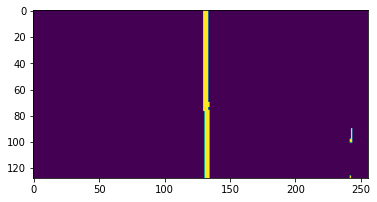

True image


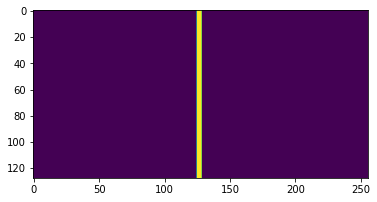

Pattern image


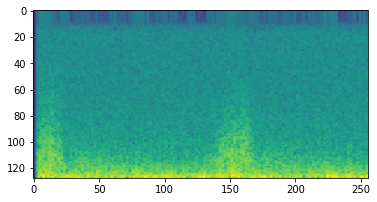

(128, 256)
(128, 256, 1)
Test 1
Predicted image


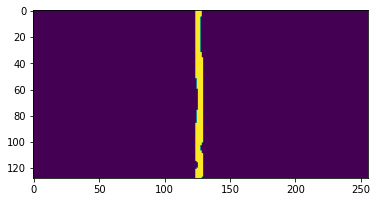

True image


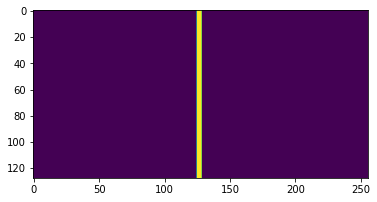

Pattern image


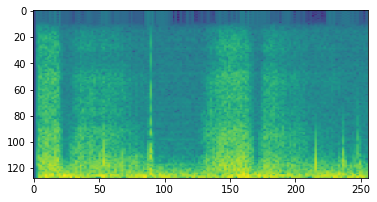

(128, 256)
(128, 256, 1)
Test 2
Predicted image


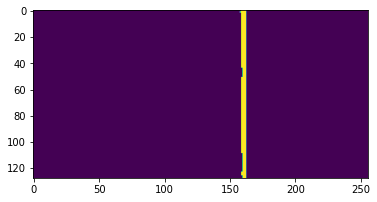

True image


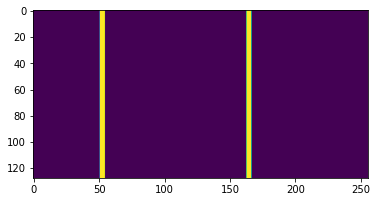

Pattern image


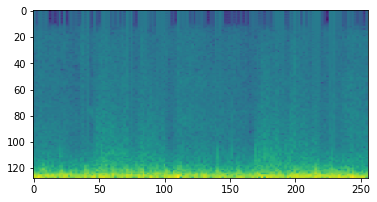

(128, 256)
(128, 256, 1)
Test 3
Predicted image


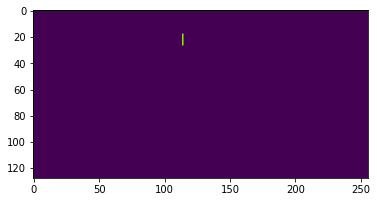

True image


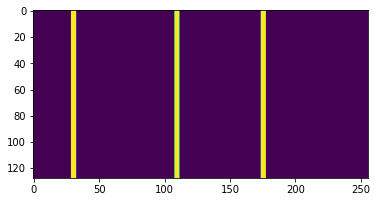

Pattern image


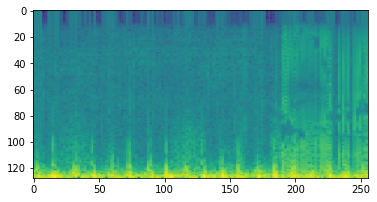

(128, 256)
(128, 256, 1)
Test 4
Predicted image


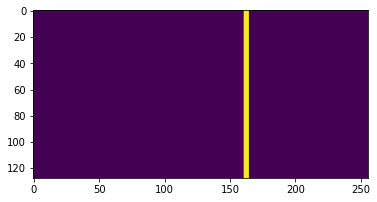

True image


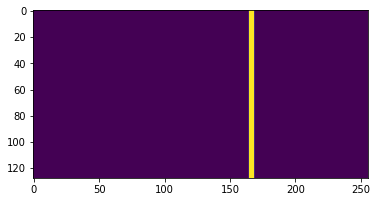

Pattern image


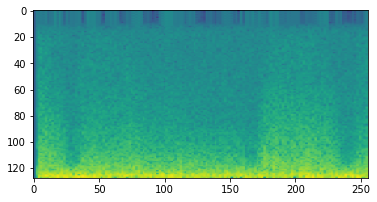

(128, 256)
(128, 256, 1)
Test 5
Predicted image


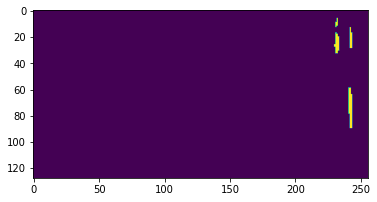

True image


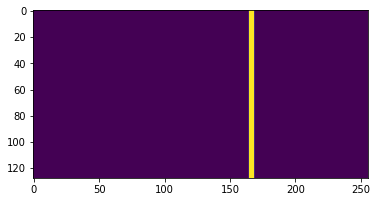

Pattern image


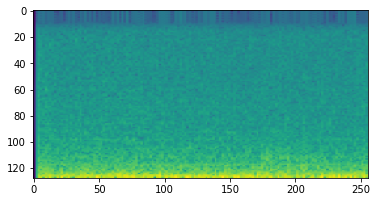

(128, 256)
(128, 256, 1)
Test 6
Predicted image


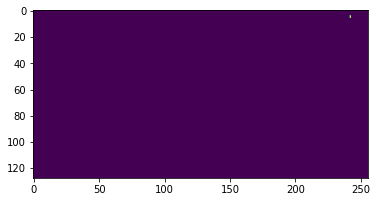

True image


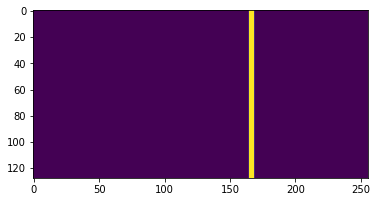

Pattern image


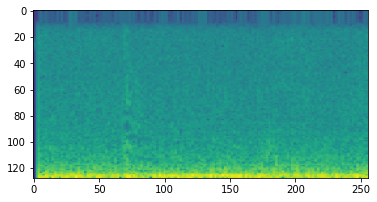

(128, 256)
(128, 256, 1)
Test 7
Predicted image


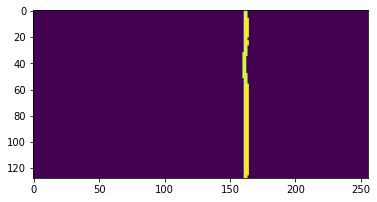

True image


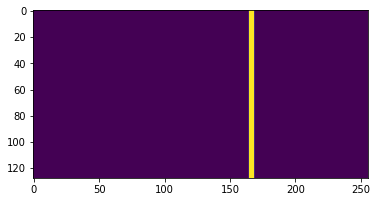

Pattern image


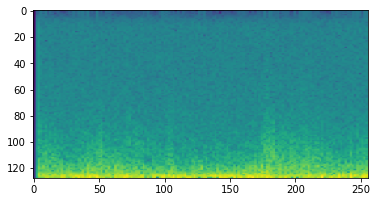

(128, 256)
(128, 256, 1)
Test 8
Predicted image


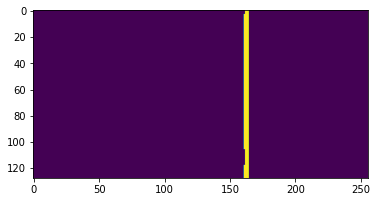

True image


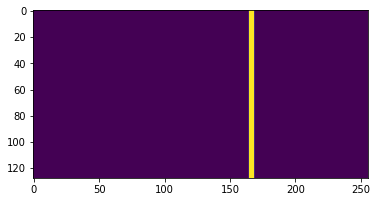

Pattern image


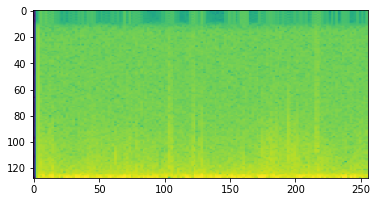

(128, 256)
(128, 256, 1)
Test 9
Predicted image


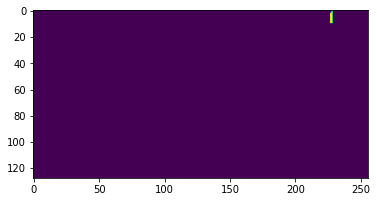

True image


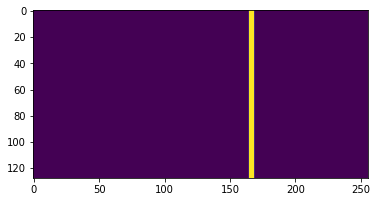

Pattern image


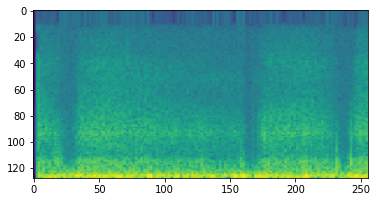

(128, 256)
(128, 256, 1)
Test 10
Predicted image


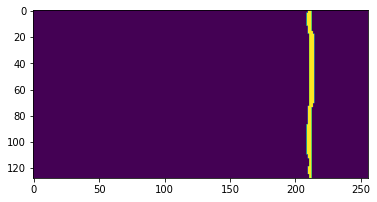

True image


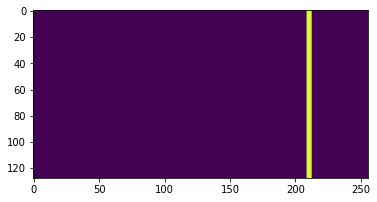

Pattern image


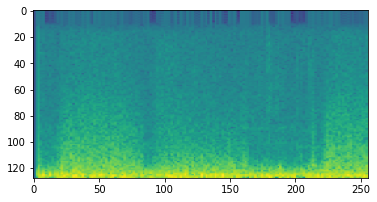

(128, 256)
(128, 256, 1)
Test 11
Predicted image


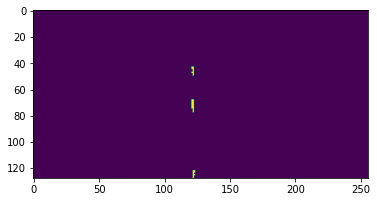

True image


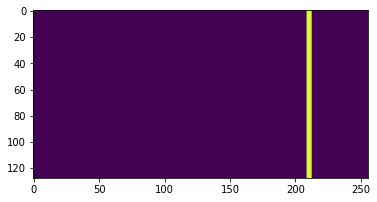

Pattern image


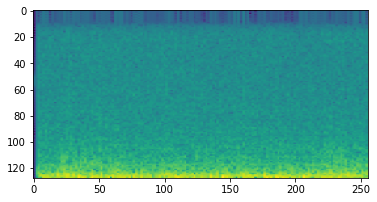

(128, 256)
(128, 256, 1)
Test 12
Predicted image


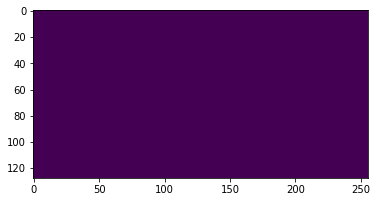

True image


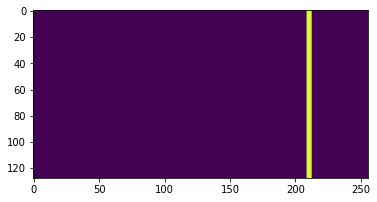

Pattern image


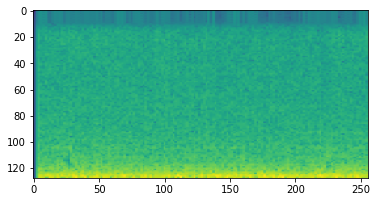

(128, 256)
(128, 256, 1)
Test 13
Predicted image


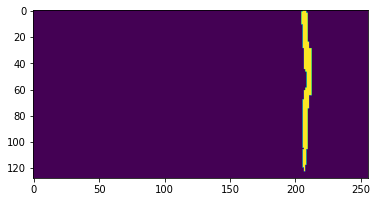

True image


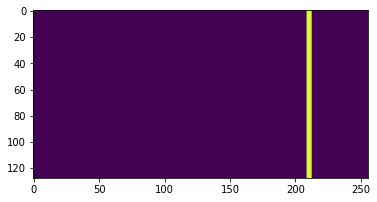

Pattern image


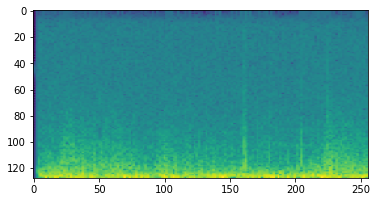

(128, 256)
(128, 256, 1)
Test 14
Predicted image


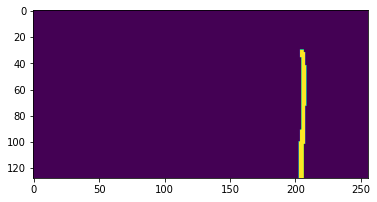

True image


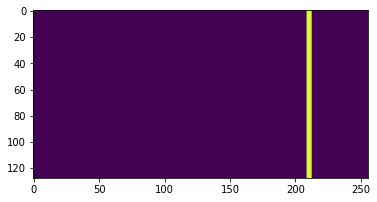

Pattern image


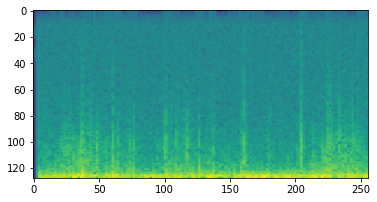

(128, 256)
(128, 256, 1)
Test 15
Predicted image


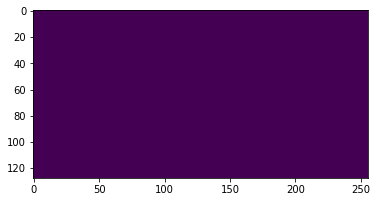

True image


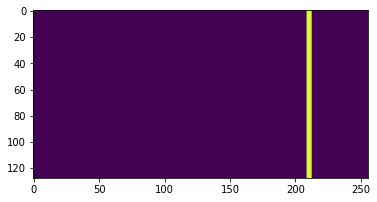

Pattern image


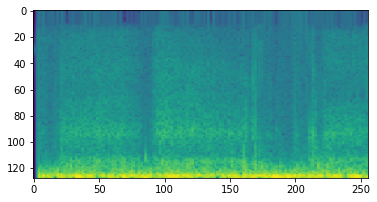

(128, 256)
(128, 256, 1)
Test 16
Predicted image


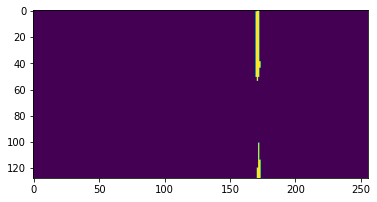

True image


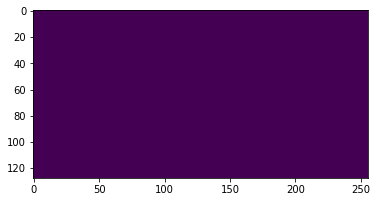

Pattern image


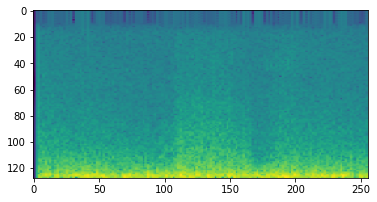

(128, 256)
(128, 256, 1)
Test 17
Predicted image


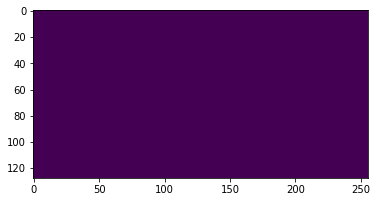

True image


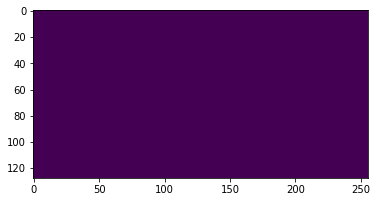

Pattern image


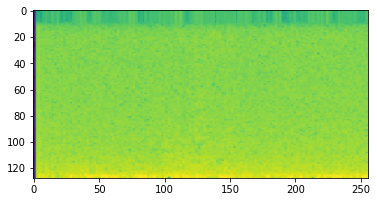

(128, 256)
(128, 256, 1)
Test 18
Predicted image


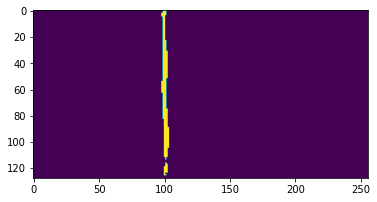

True image


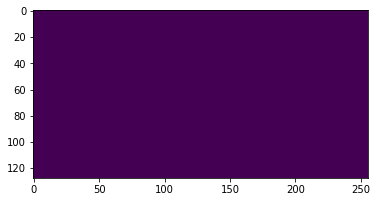

Pattern image


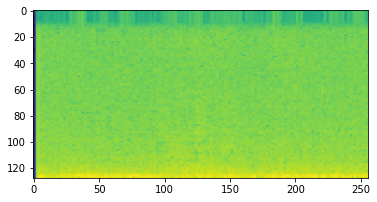

(128, 256)
(128, 256, 1)
Test 19
Predicted image


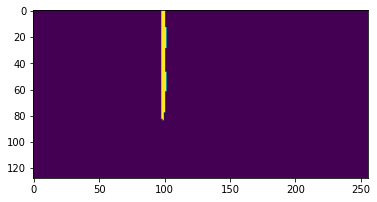

True image


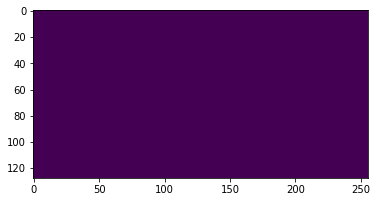

Pattern image


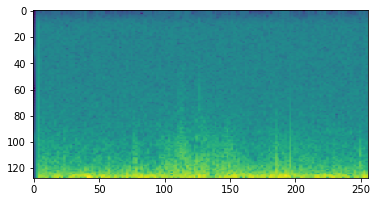

(128, 256)
(128, 256, 1)
Test 20
Predicted image


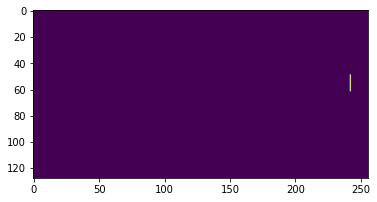

True image


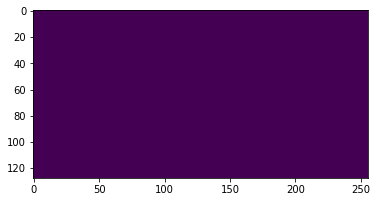

Pattern image


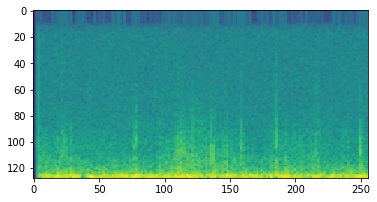

(128, 256)
(128, 256, 1)
Test 21
Predicted image


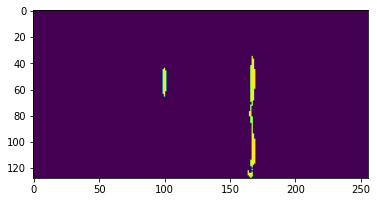

True image


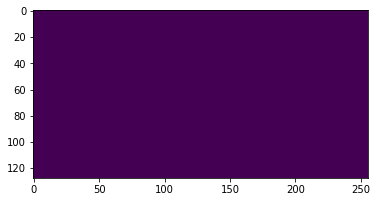

Pattern image


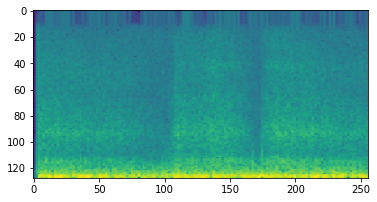

(128, 256)
(128, 256, 1)
Test 22
Predicted image


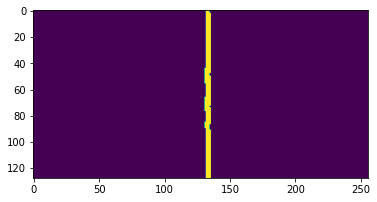

True image


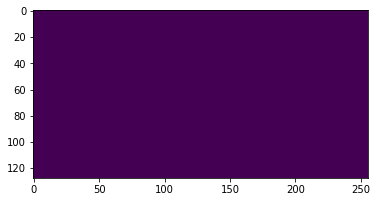

Pattern image


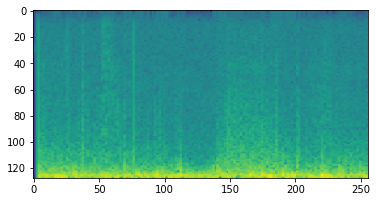

(128, 256)
(128, 256, 1)
Test 23
Predicted image


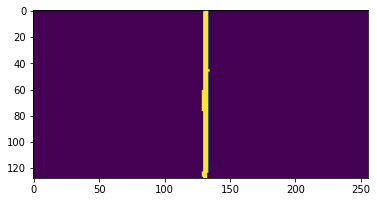

True image


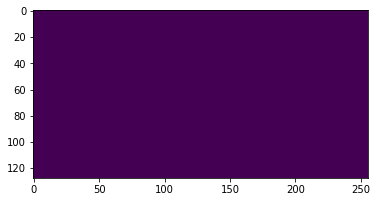

Pattern image


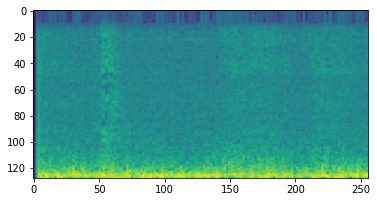

(128, 256)
(128, 256, 1)
Test 24
Predicted image


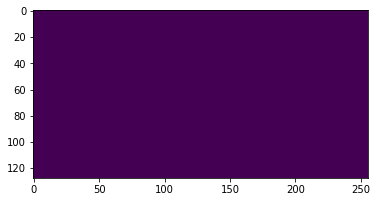

True image


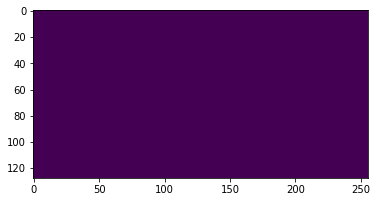

Pattern image


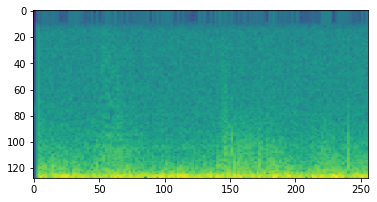

(128, 256)
(128, 256, 1)
Test 25
Predicted image


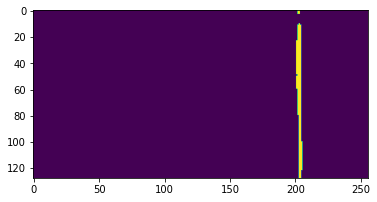

True image


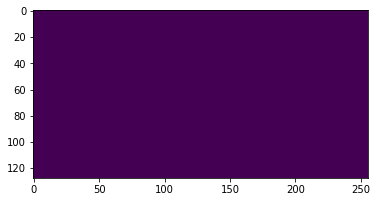

Pattern image


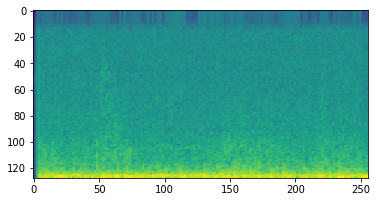

(128, 256)
(128, 256, 1)
Test 26
Predicted image


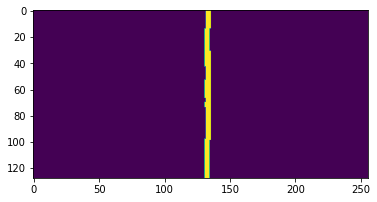

True image


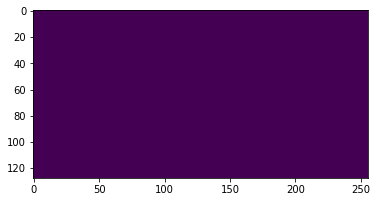

Pattern image


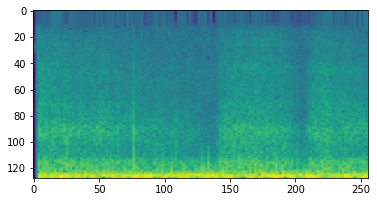

(128, 256)
(128, 256, 1)
Test 27
Predicted image


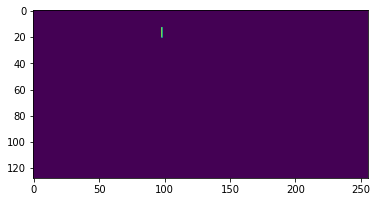

True image


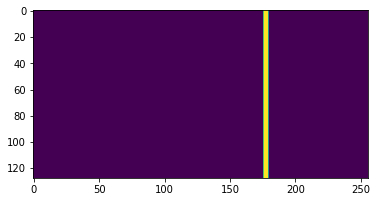

Pattern image


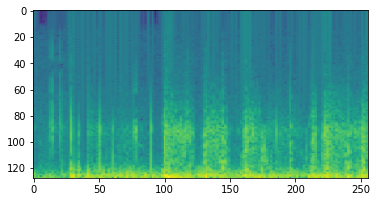

(128, 256)
(128, 256, 1)
Test 28
Predicted image


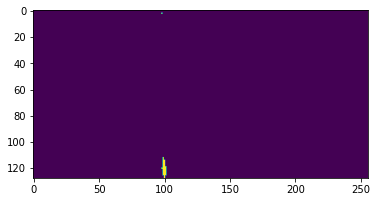

True image


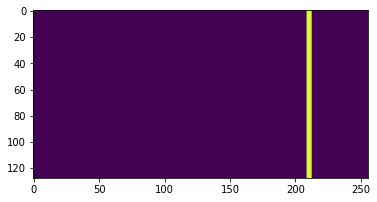

Pattern image


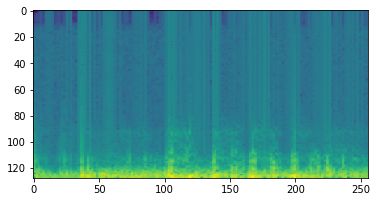

(128, 256)
(128, 256, 1)
Test 29
Predicted image


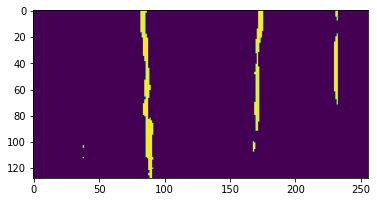

True image


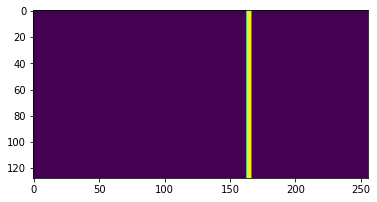

Pattern image


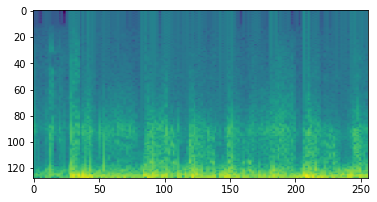

(128, 256)
(128, 256, 1)
Test 30
Predicted image


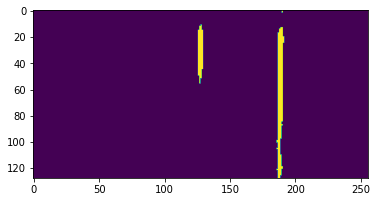

True image


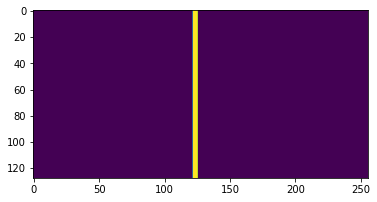

Pattern image


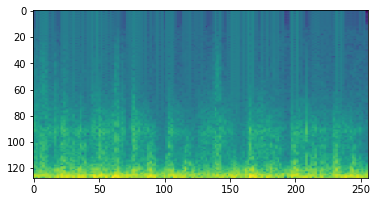

(128, 256)
(128, 256, 1)
Test 31
Predicted image


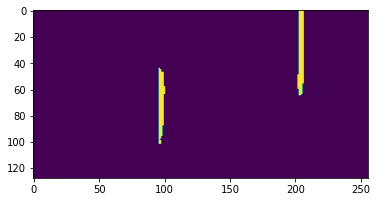

True image


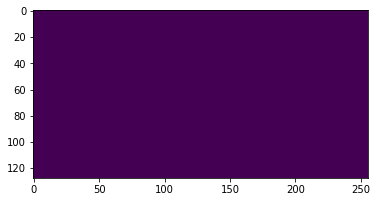

Pattern image


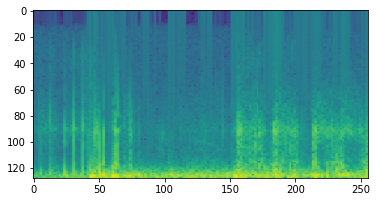

(128, 256)
(128, 256, 1)
Test 32
Predicted image


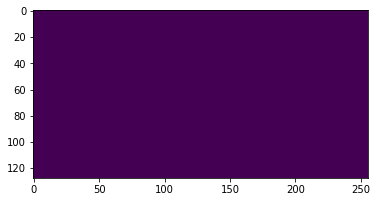

True image


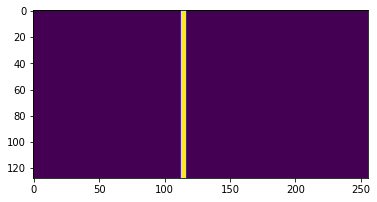

Pattern image


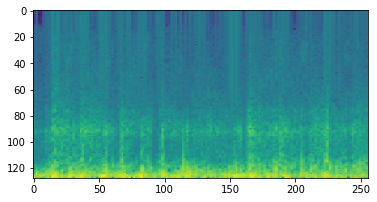

(128, 256)
(128, 256, 1)
Test 33
Predicted image


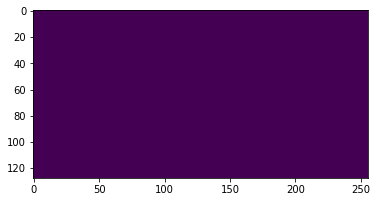

True image


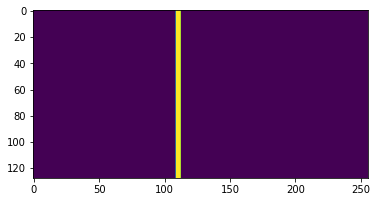

Pattern image


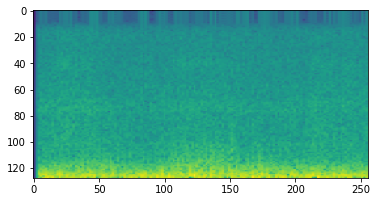

(128, 256)
(128, 256, 1)
Test 34
Predicted image


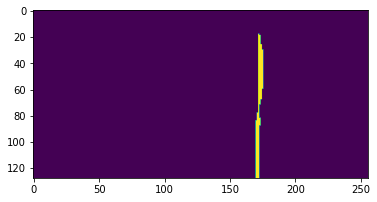

True image


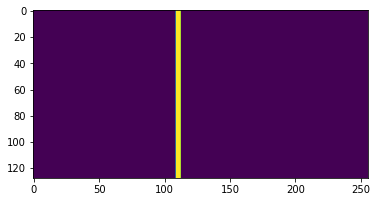

Pattern image


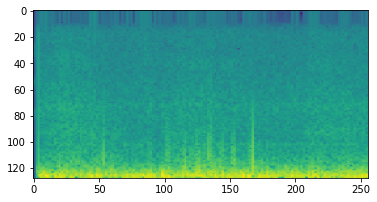

(128, 256)
(128, 256, 1)
Test 35
Predicted image


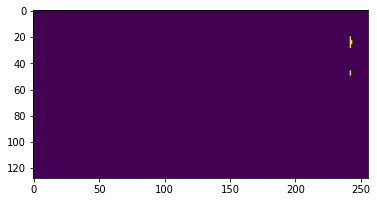

True image


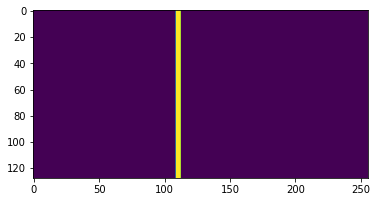

Pattern image


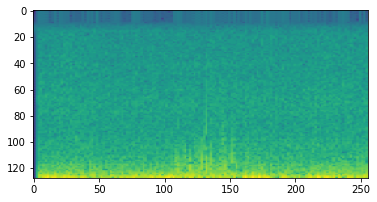

(128, 256)
(128, 256, 1)
Test 36
Predicted image


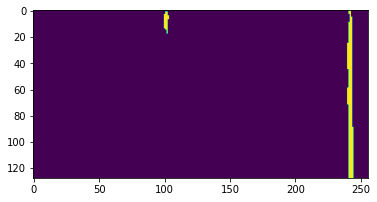

True image


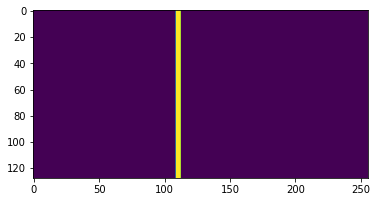

Pattern image


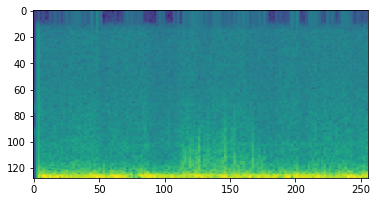

(128, 256)
(128, 256, 1)
Test 37
Predicted image


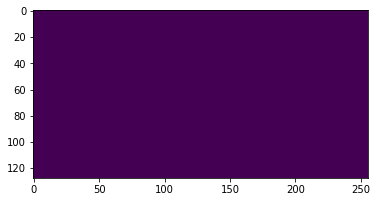

True image


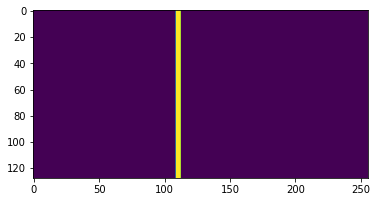

Pattern image


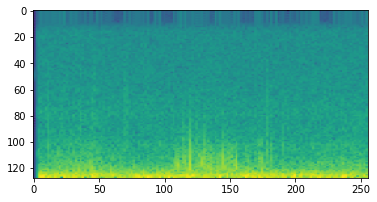

(128, 256)
(128, 256, 1)
Test 38
Predicted image


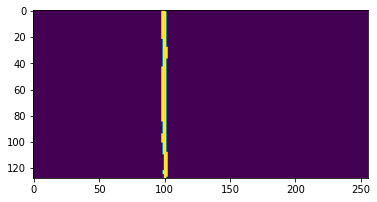

True image


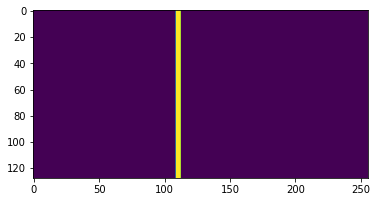

Pattern image


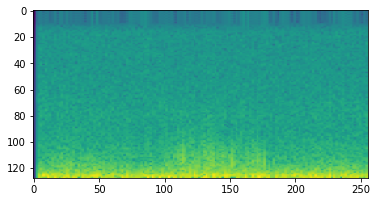

(128, 256)
(128, 256, 1)
Test 39
Predicted image


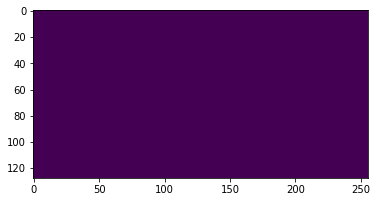

True image


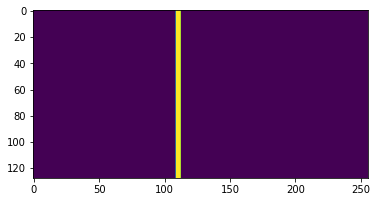

Pattern image


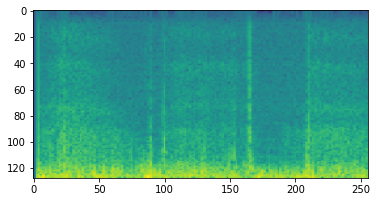

(128, 256)
(128, 256, 1)
Test 40
Predicted image


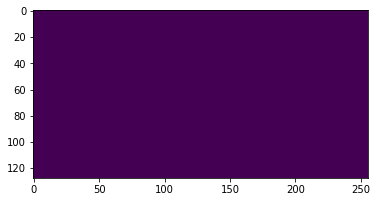

True image


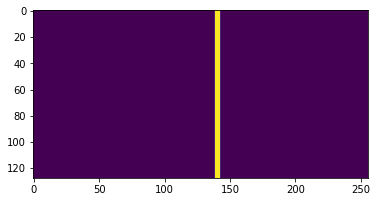

Pattern image


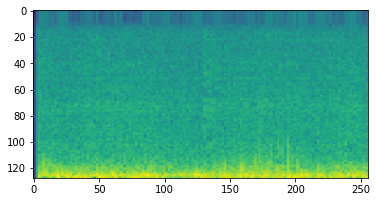

(128, 256)
(128, 256, 1)
Test 41
Predicted image


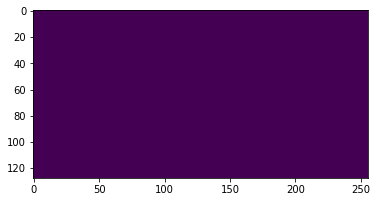

True image


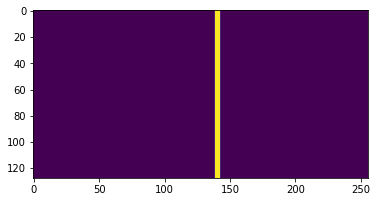

Pattern image


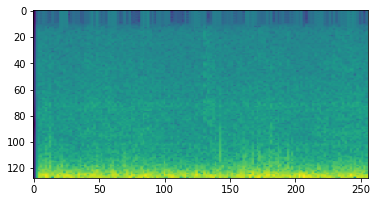

(128, 256)
(128, 256, 1)
Test 42
Predicted image


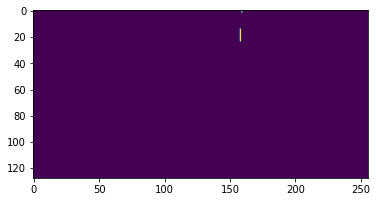

True image


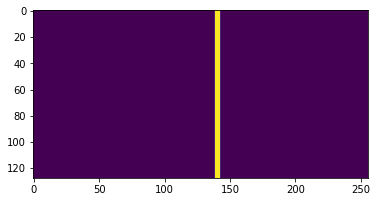

Pattern image


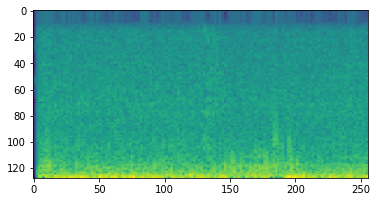

(128, 256)
(128, 256, 1)
Test 43
Predicted image


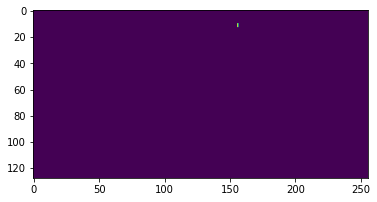

True image


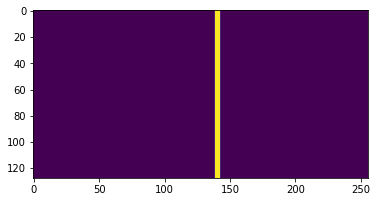

Pattern image


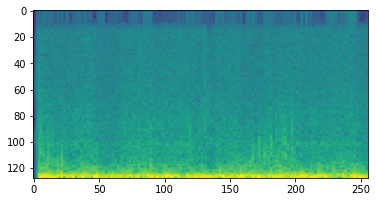

(128, 256)
(128, 256, 1)
Test 44
Predicted image


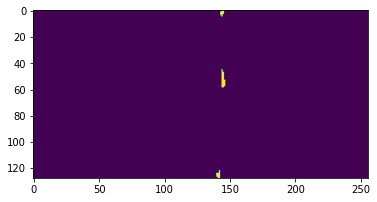

True image


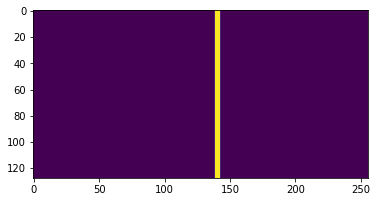

Pattern image


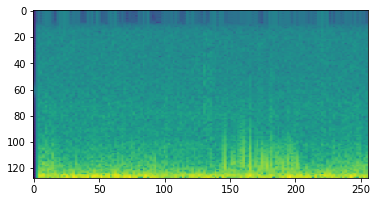

(128, 256)
(128, 256, 1)
Test 45
Predicted image


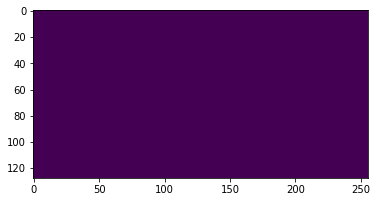

True image


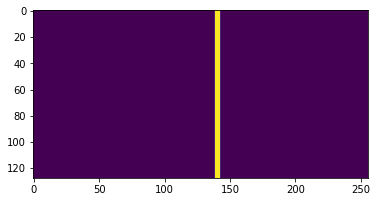

Pattern image


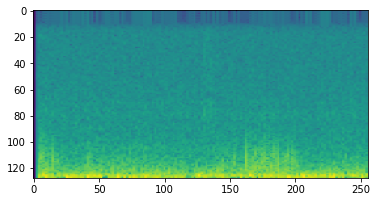

(128, 256)
(128, 256, 1)
Test 46
Predicted image


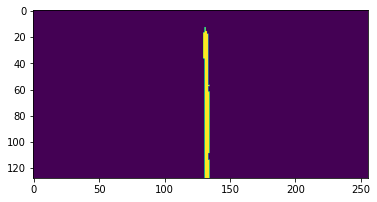

True image


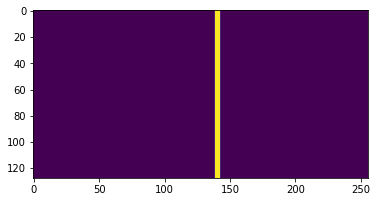

Pattern image


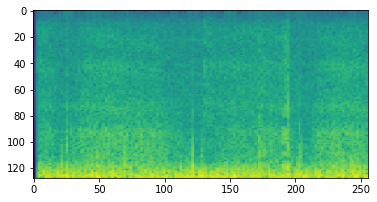

(128, 256)
(128, 256, 1)
Test 47
Predicted image


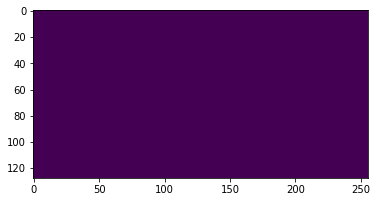

True image


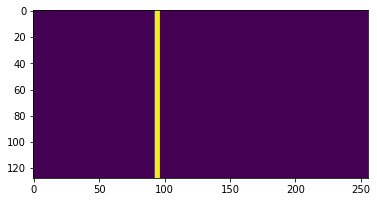

Pattern image


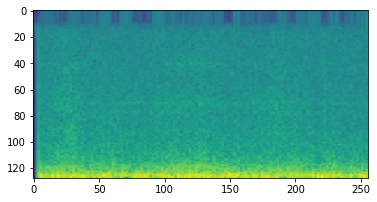

(128, 256)
(128, 256, 1)
Test 48
Predicted image


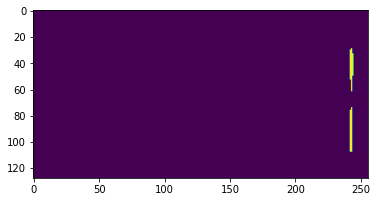

True image


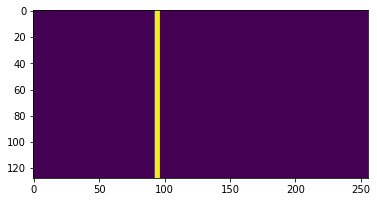

Pattern image


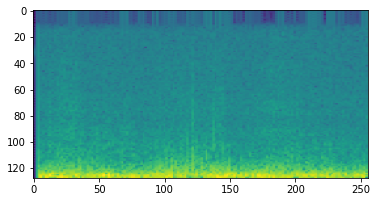

(128, 256)
(128, 256, 1)
Test 49
Predicted image


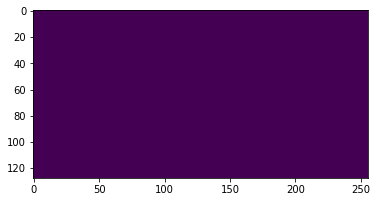

True image


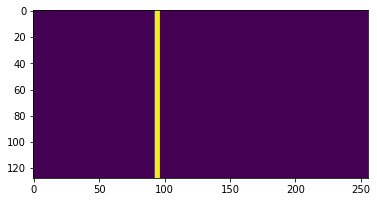

Pattern image


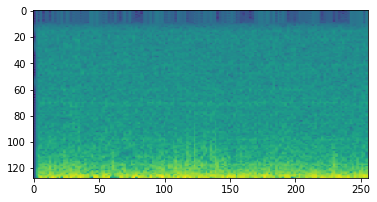

(128, 256)
(128, 256, 1)
Test 50
Predicted image


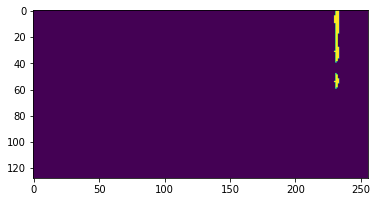

True image


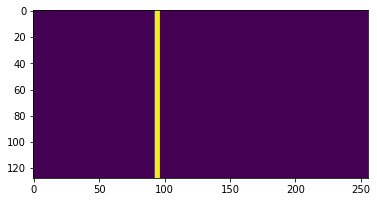

Pattern image


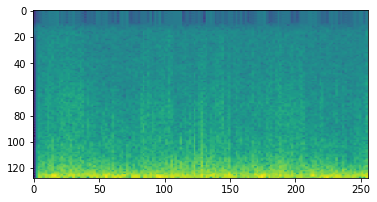

(128, 256)
(128, 256, 1)
Test 51
Predicted image


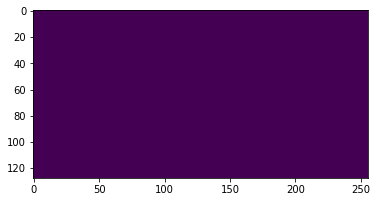

True image


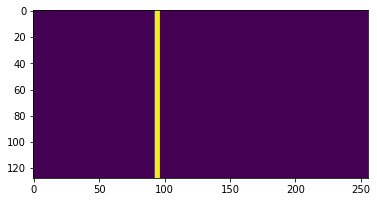

Pattern image


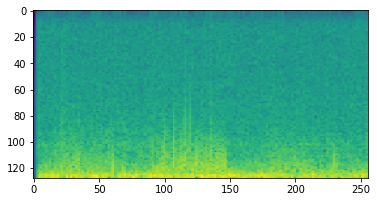

(128, 256)
(128, 256, 1)
Test 52
Predicted image


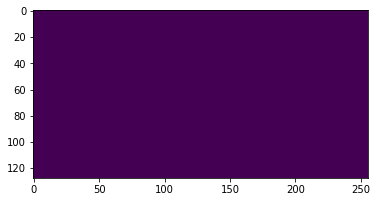

True image


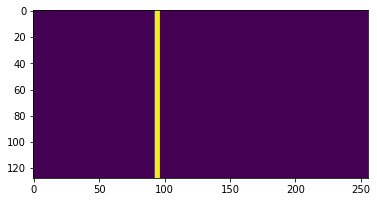

Pattern image


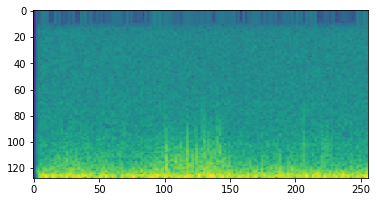

(128, 256)
(128, 256, 1)
Test 53
Predicted image


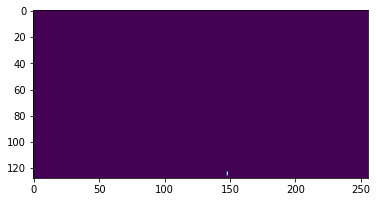

True image


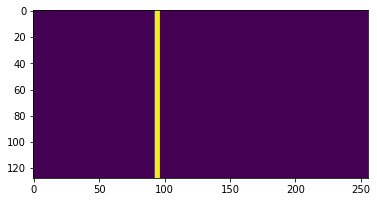

Pattern image


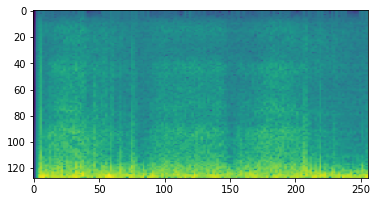

(128, 256)
(128, 256, 1)
Test 54
Predicted image


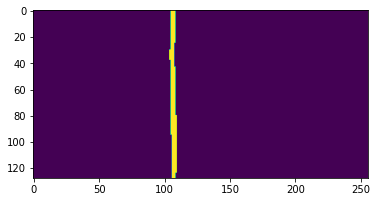

True image


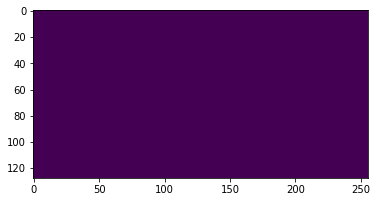

Pattern image


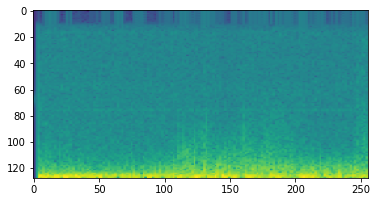

(128, 256)
(128, 256, 1)
Test 55
Predicted image


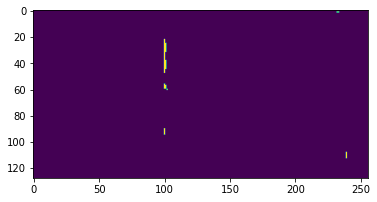

True image


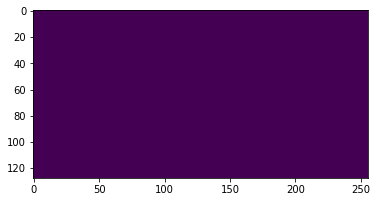

Pattern image


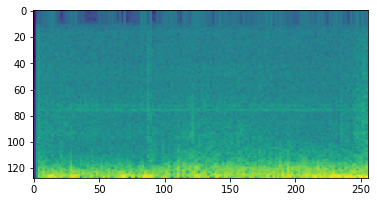

(128, 256)
(128, 256, 1)
Test 56
Predicted image


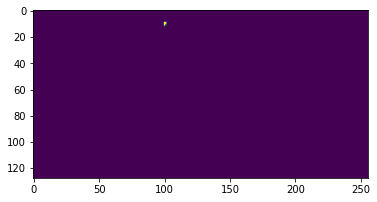

True image


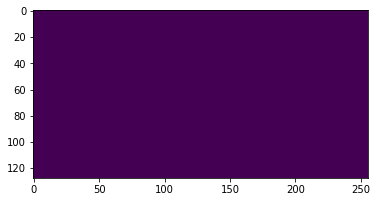

Pattern image


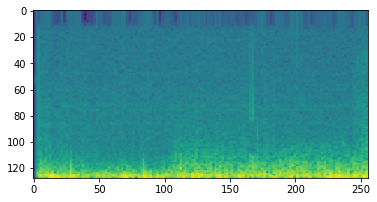

(128, 256)
(128, 256, 1)
Test 57
Predicted image


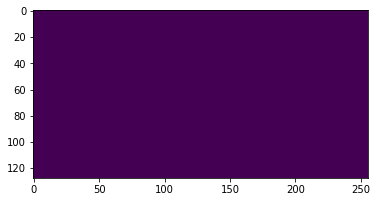

True image


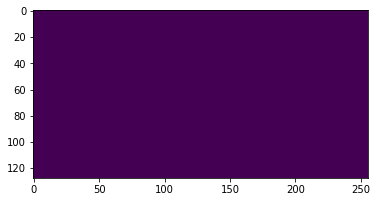

Pattern image


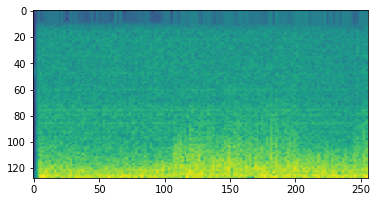

(128, 256)
(128, 256, 1)
Test 58
Predicted image


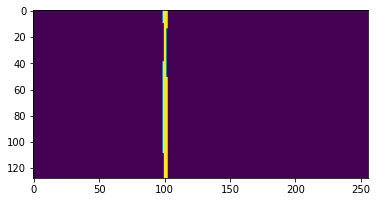

True image


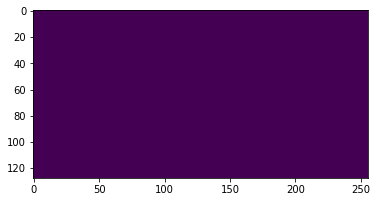

Pattern image


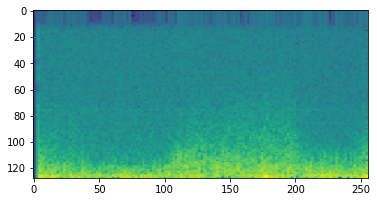

(128, 256)
(128, 256, 1)
Test 59
Predicted image


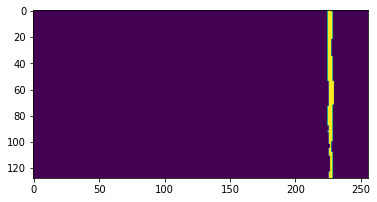

True image


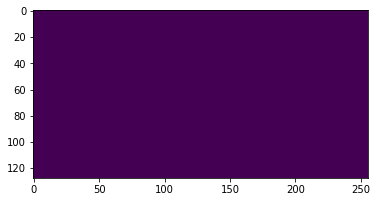

Pattern image


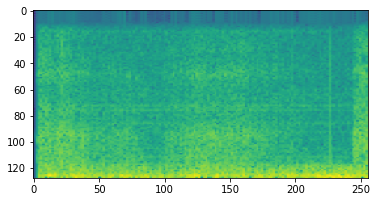

(128, 256)
(128, 256, 1)
Test 60
Predicted image


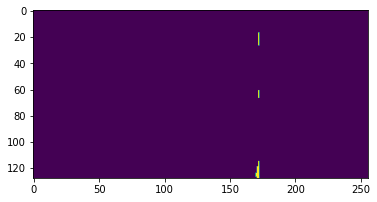

True image


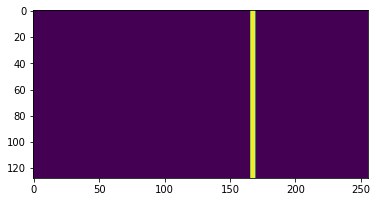

Pattern image


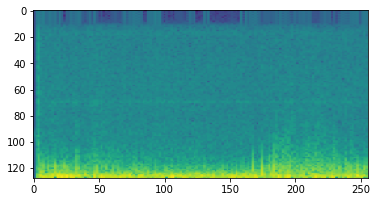

(128, 256)
(128, 256, 1)
Test 61
Predicted image


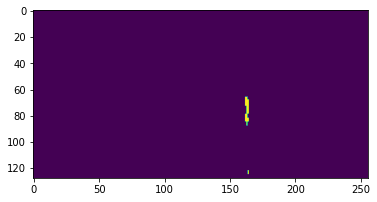

True image


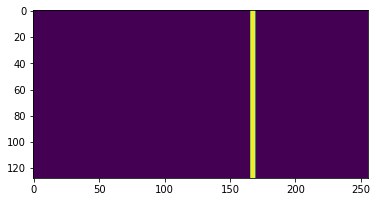

Pattern image


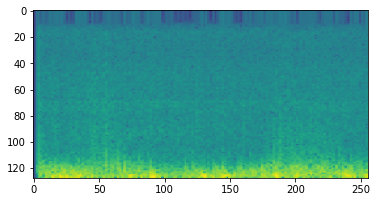

(128, 256)
(128, 256, 1)
Test 62
Predicted image


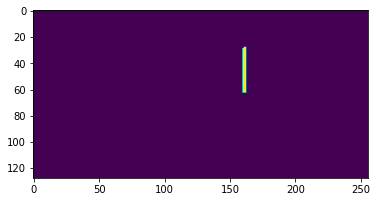

True image


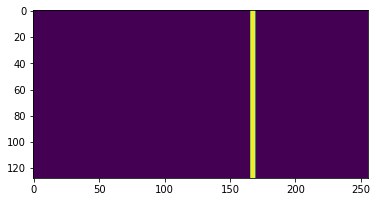

Pattern image


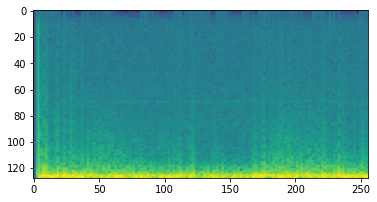

(128, 256)
(128, 256, 1)
Test 63
Predicted image


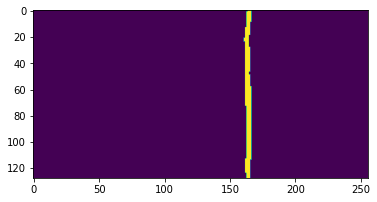

True image


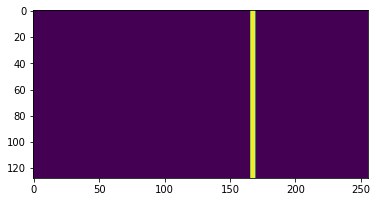

Pattern image


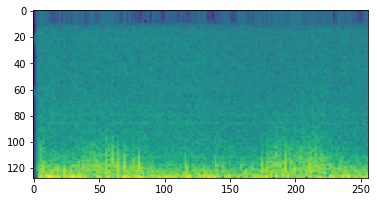

(128, 256)
(128, 256, 1)
Test 64
Predicted image


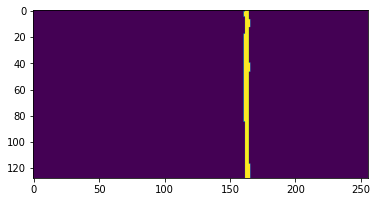

True image


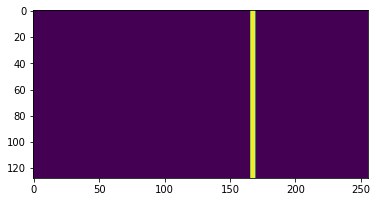

Pattern image


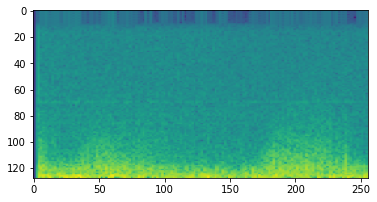

(128, 256)
(128, 256, 1)
Test 65
Predicted image


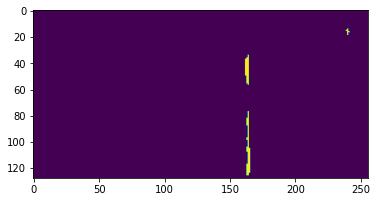

True image


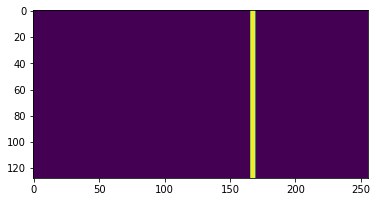

Pattern image


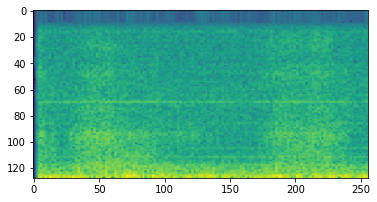

(128, 256)
(128, 256, 1)
Test 66
Predicted image


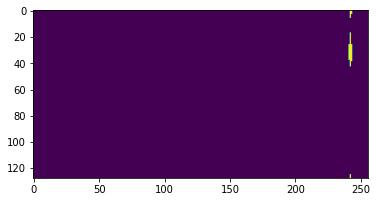

True image


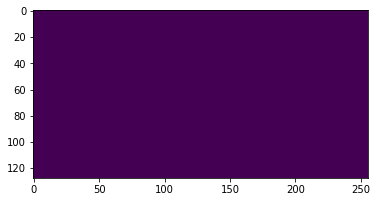

Pattern image


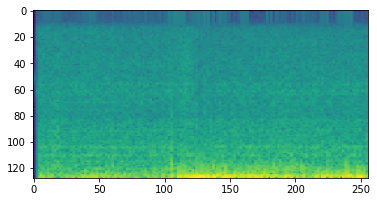

(128, 256)
(128, 256, 1)
Test 67
Predicted image


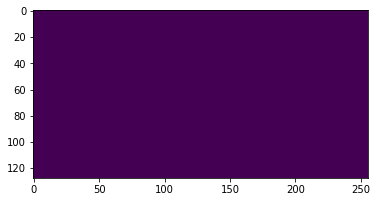

True image


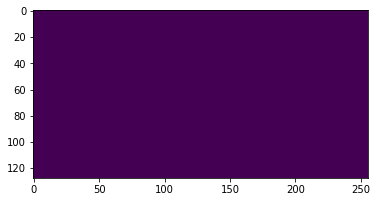

Pattern image


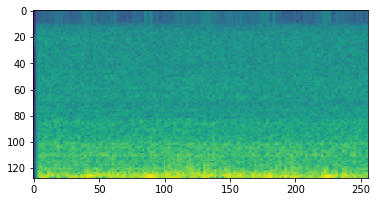

(128, 256)
(128, 256, 1)
Test 68
Predicted image


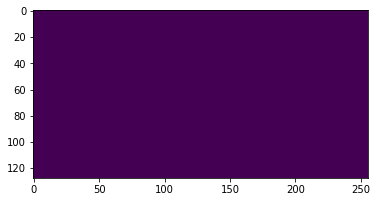

True image


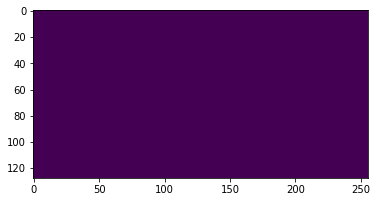

Pattern image


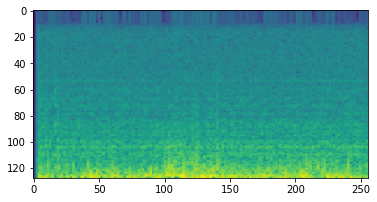

(128, 256)
(128, 256, 1)
Test 69
Predicted image


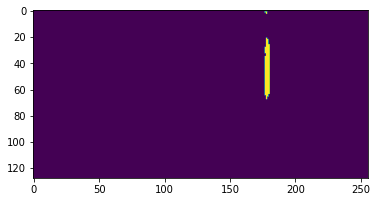

True image


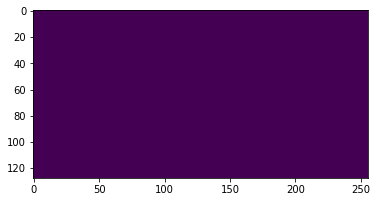

Pattern image


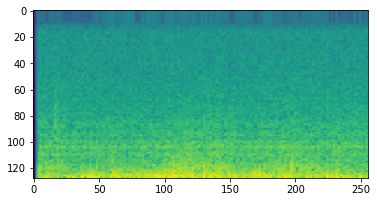

(128, 256)
(128, 256, 1)
Test 70
Predicted image


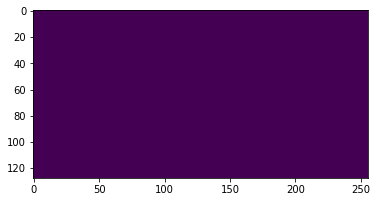

True image


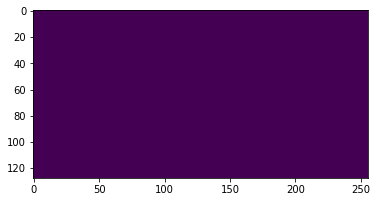

Pattern image


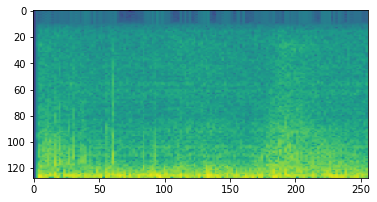

(128, 256)
(128, 256, 1)
Test 71
Predicted image


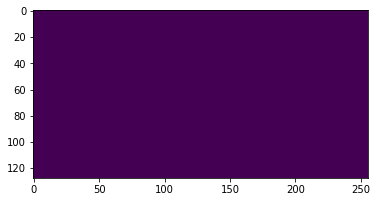

True image


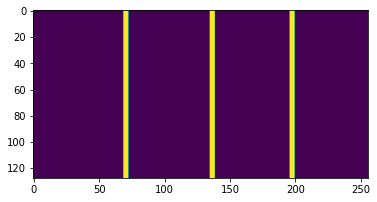

Pattern image


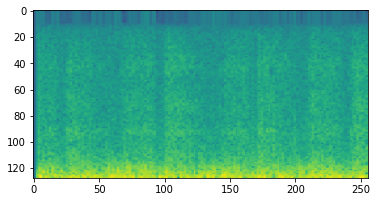

(128, 256)
(128, 256, 1)
Test 72
Predicted image


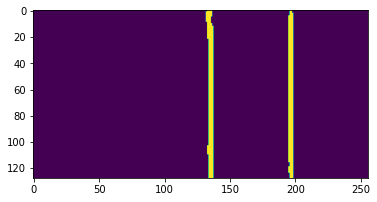

True image


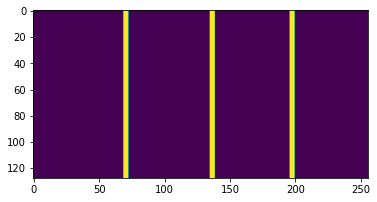

Pattern image


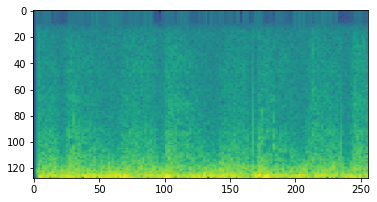

(128, 256)
(128, 256, 1)
Test 73
Predicted image


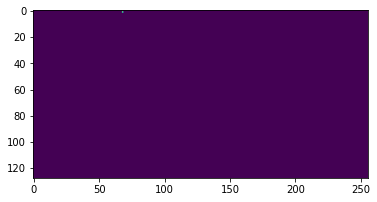

True image


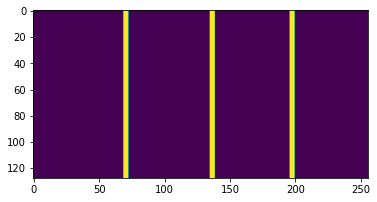

Pattern image


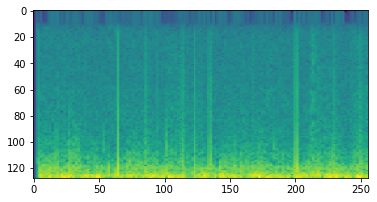

(128, 256)
(128, 256, 1)
Test 74
Predicted image


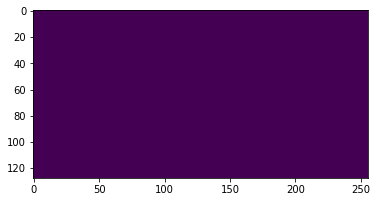

True image


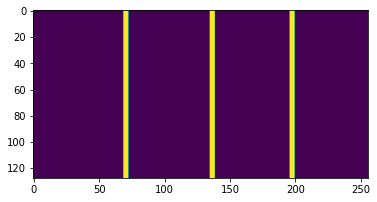

Pattern image


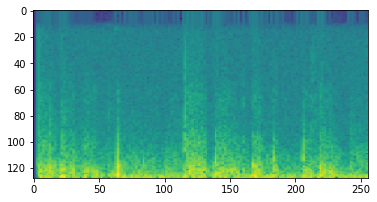

(128, 256)
(128, 256, 1)
Test 75
Predicted image


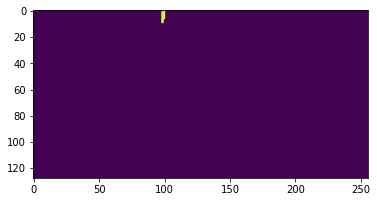

True image


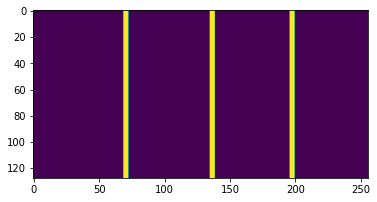

Pattern image


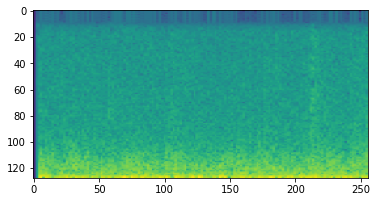

(128, 256)
(128, 256, 1)
Test 76
Predicted image


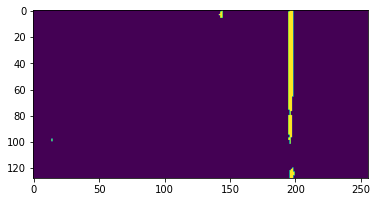

True image


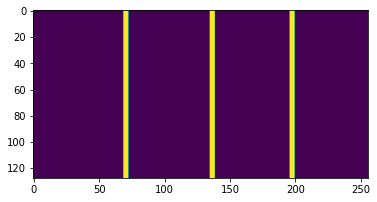

Pattern image


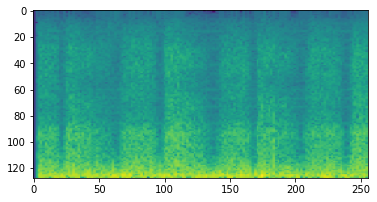

(128, 256)
(128, 256, 1)
Test 77
Predicted image


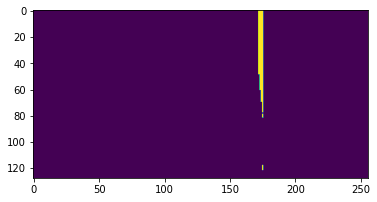

True image


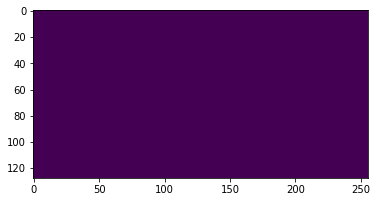

Pattern image


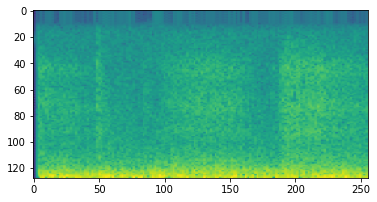

(128, 256)
(128, 256, 1)
Test 78
Predicted image


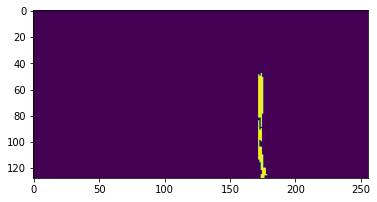

True image


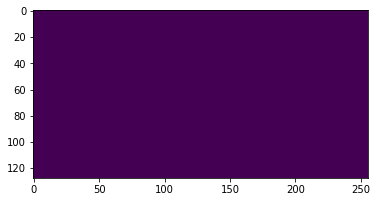

Pattern image


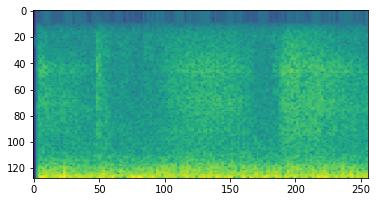

(128, 256)
(128, 256, 1)
Test 79
Predicted image


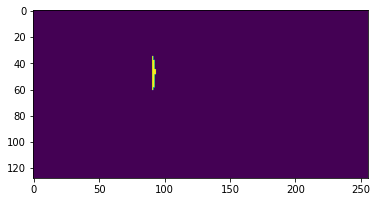

True image


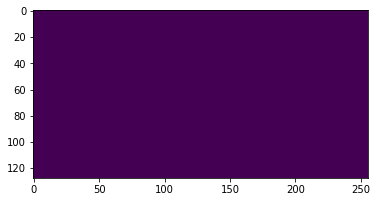

Pattern image


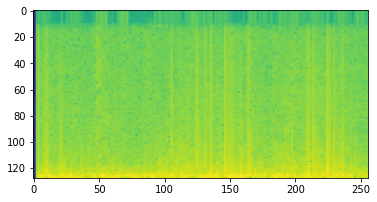

(128, 256)
(128, 256, 1)
Test 80
Predicted image


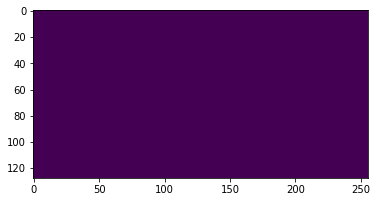

True image


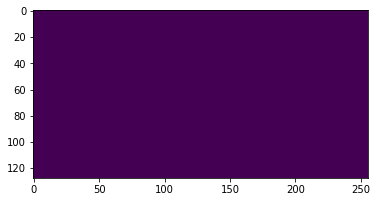

Pattern image


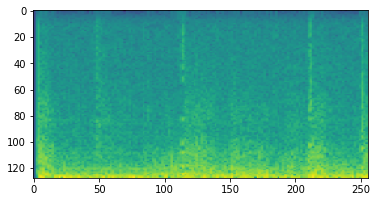

(128, 256)
(128, 256, 1)
Test 81
Predicted image


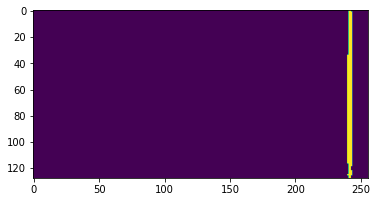

True image


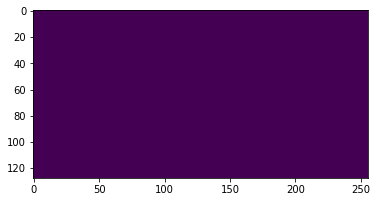

Pattern image


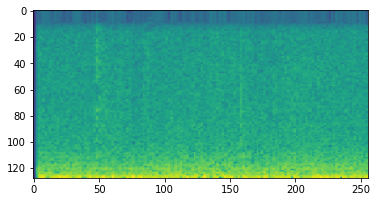

(128, 256)
(128, 256, 1)
Test 82
Predicted image


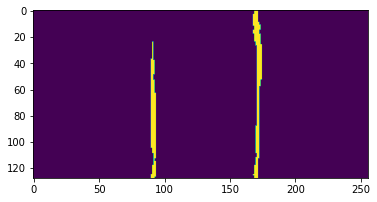

True image


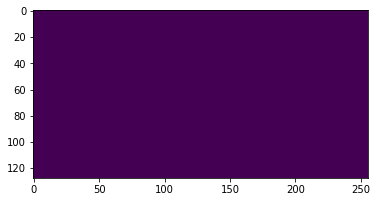

Pattern image


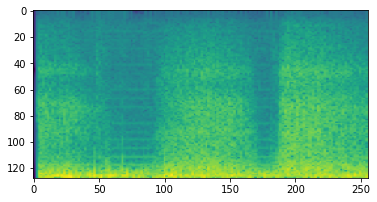

(128, 256)
(128, 256, 1)
Test 83
Predicted image


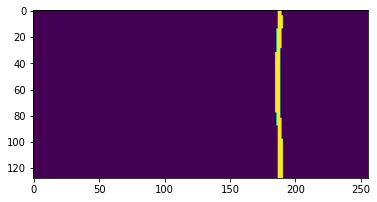

True image


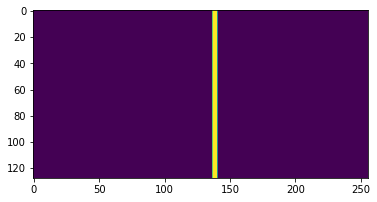

Pattern image


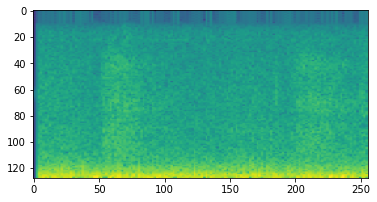

(128, 256)
(128, 256, 1)
Test 84
Predicted image


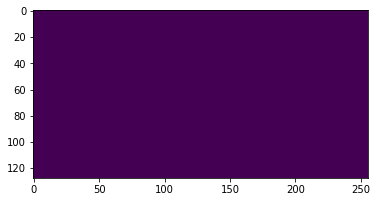

True image


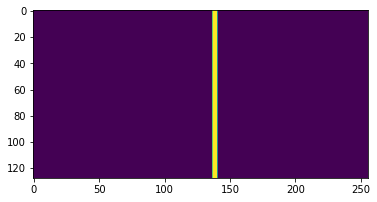

Pattern image


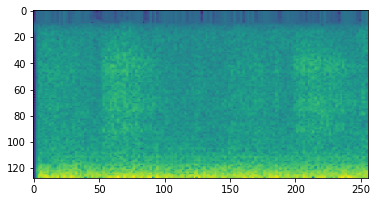

(128, 256)
(128, 256, 1)
Test 85
Predicted image


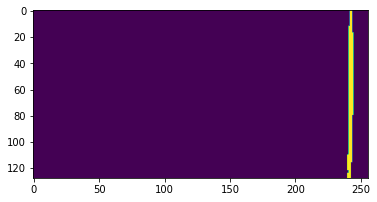

True image


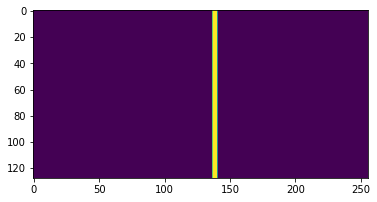

Pattern image


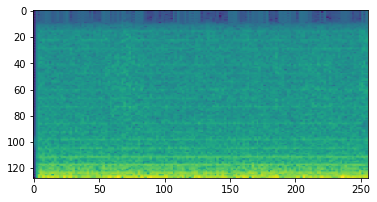

(128, 256)
(128, 256, 1)
Test 86
Predicted image


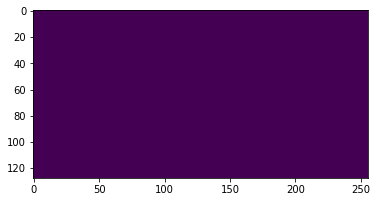

True image


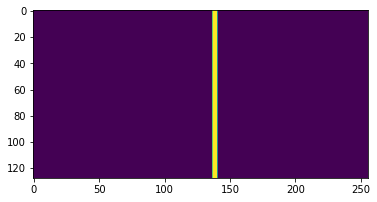

Pattern image


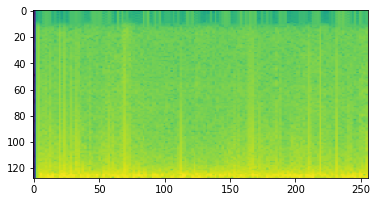

(128, 256)
(128, 256, 1)
Test 87
Predicted image


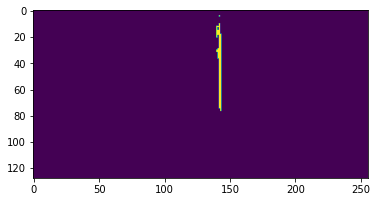

True image


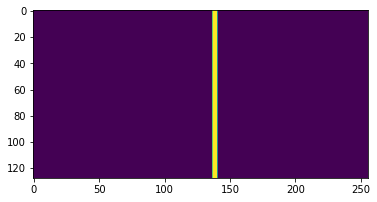

Pattern image


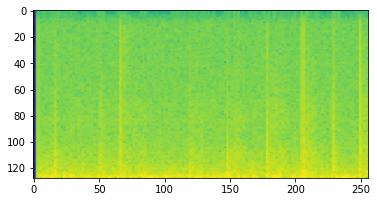

(128, 256)
(128, 256, 1)
Test 88
Predicted image


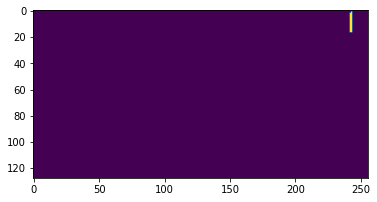

True image


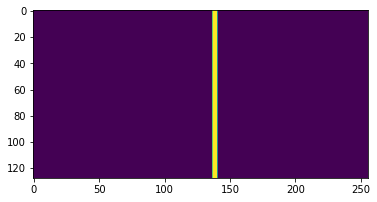

Pattern image


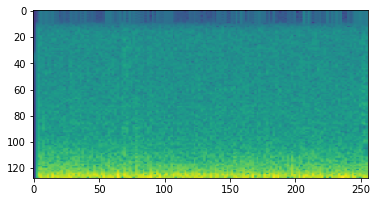

(128, 256)
(128, 256, 1)
Test 89
Predicted image


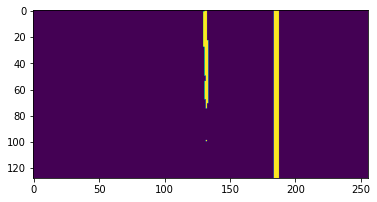

True image


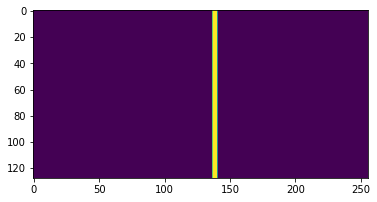

Pattern image


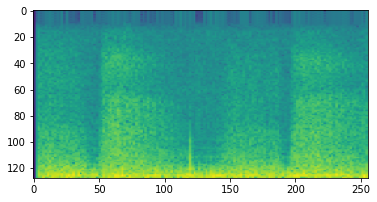

(128, 256)
(128, 256, 1)
Test 90
Predicted image


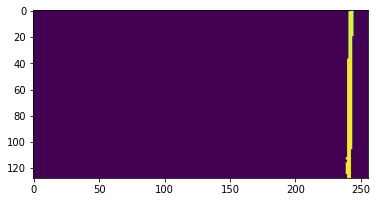

True image


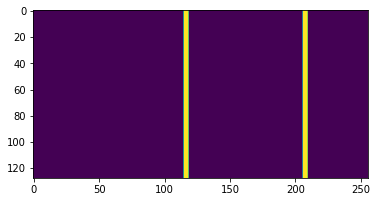

Pattern image


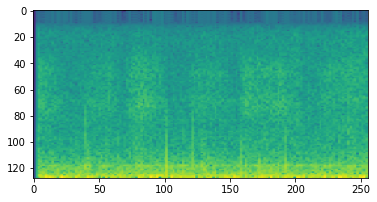

(128, 256)
(128, 256, 1)
Test 91
Predicted image


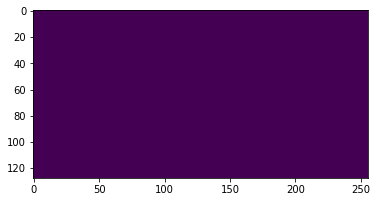

True image


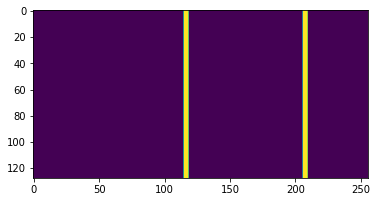

Pattern image


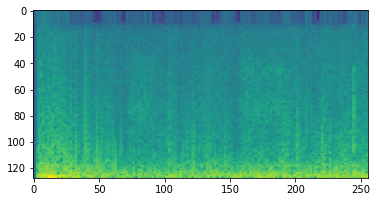

(128, 256)
(128, 256, 1)
Test 92
Predicted image


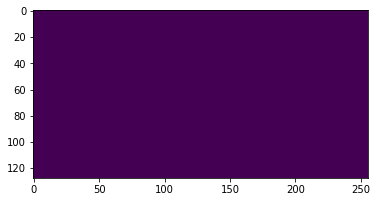

True image


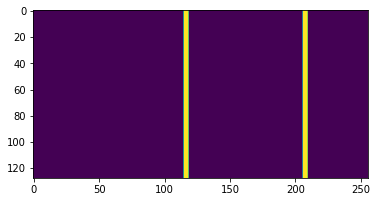

Pattern image


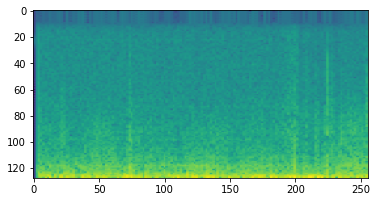

(128, 256)
(128, 256, 1)
Test 93
Predicted image


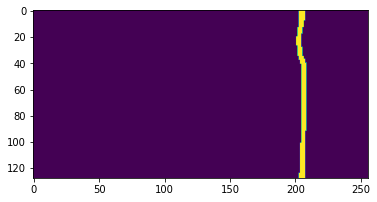

True image


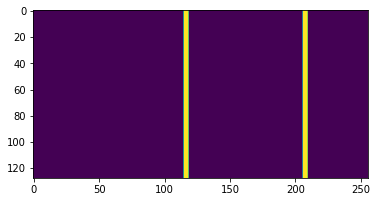

Pattern image


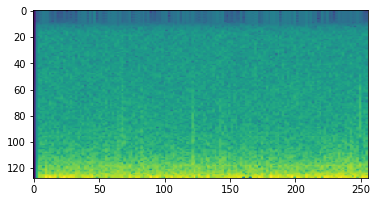

(128, 256)
(128, 256, 1)
Test 94
Predicted image


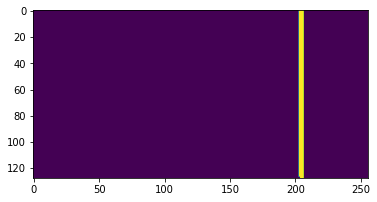

True image


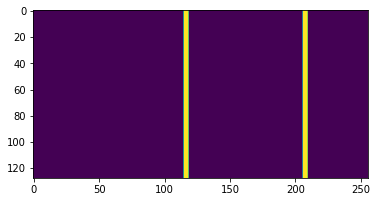

Pattern image


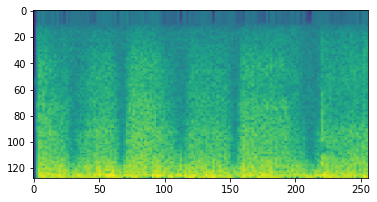

(128, 256)
(128, 256, 1)
Test 95
Predicted image


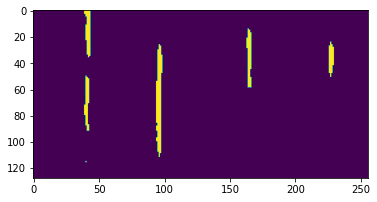

True image


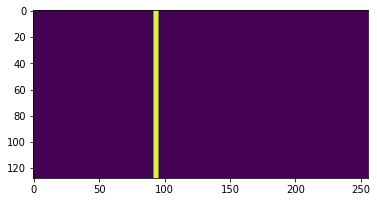

Pattern image


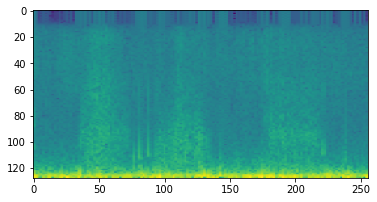

(128, 256)
(128, 256, 1)
Test 96
Predicted image


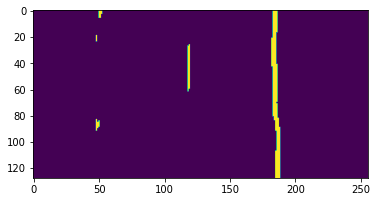

True image


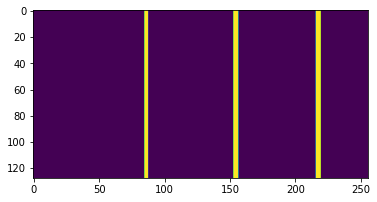

Pattern image


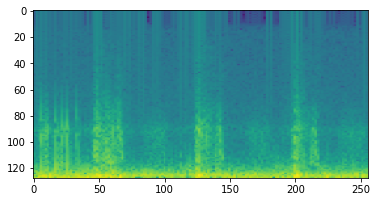

(128, 256)
(128, 256, 1)
Test 97
Predicted image


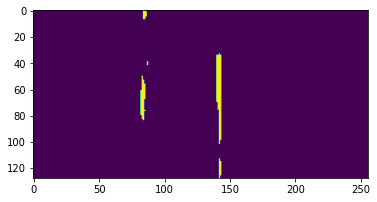

True image


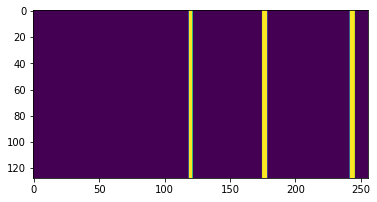

Pattern image


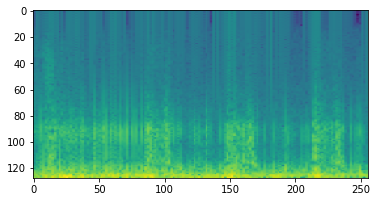

(128, 256)
(128, 256, 1)
Test 98
Predicted image


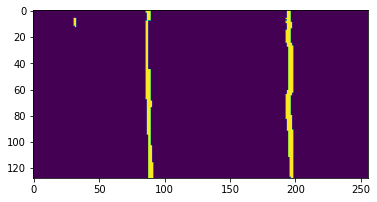

True image


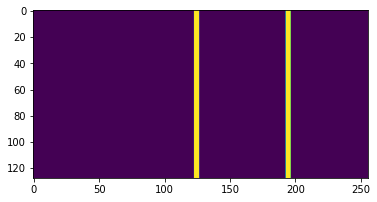

Pattern image


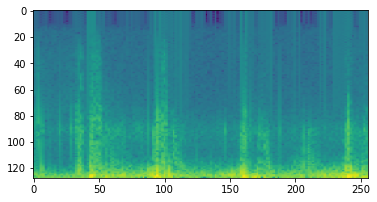

(128, 256)
(128, 256, 1)
Test 99
Predicted image


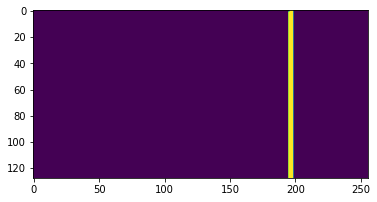

True image


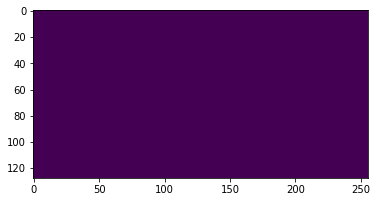

Pattern image


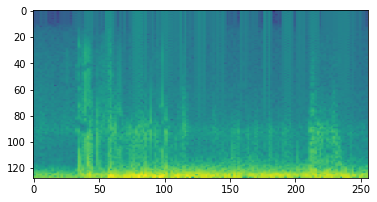

(128, 256)
(128, 256, 1)
Test 100
Predicted image


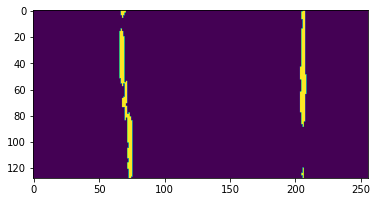

True image


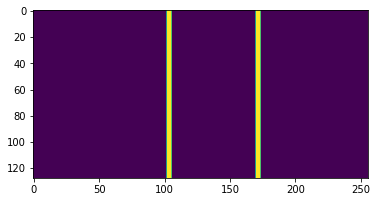

Pattern image


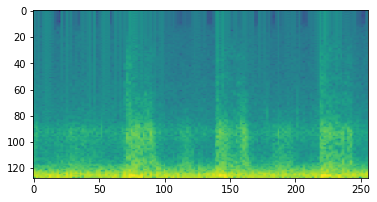

(128, 256)
(128, 256, 1)
Test 101
Predicted image


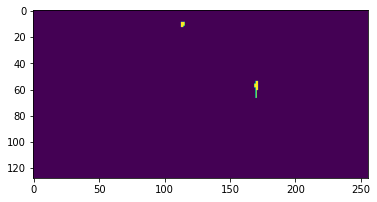

True image


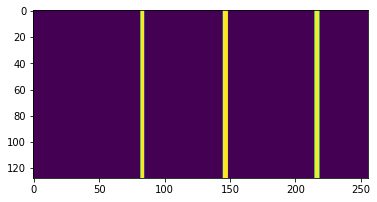

Pattern image


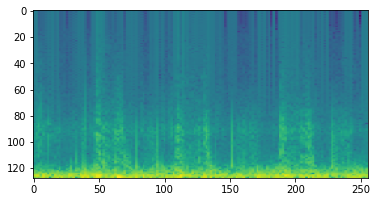

(128, 256)
(128, 256, 1)
Test 102
Predicted image


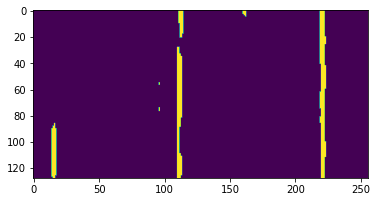

True image


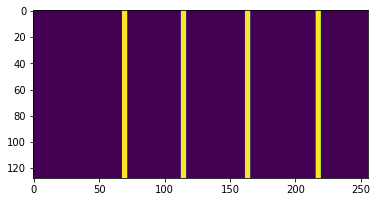

Pattern image


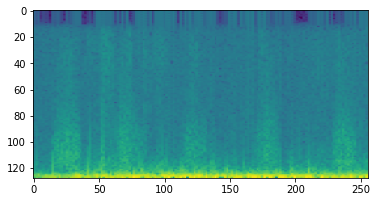

(128, 256)
(128, 256, 1)
Test 103
Predicted image


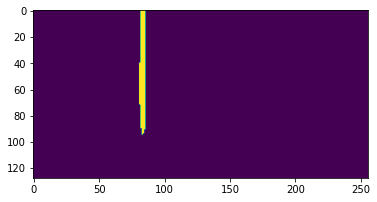

True image


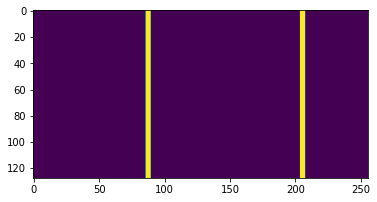

Pattern image


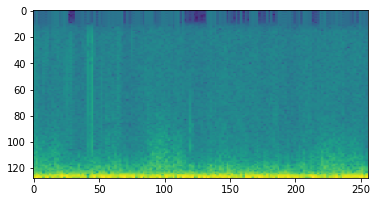

(128, 256)
(128, 256, 1)
Test 104
Predicted image


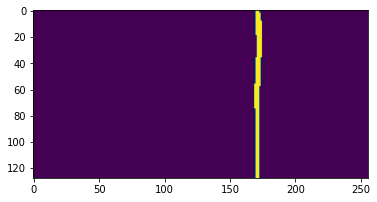

True image


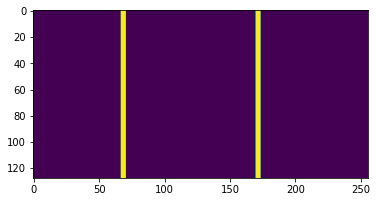

Pattern image


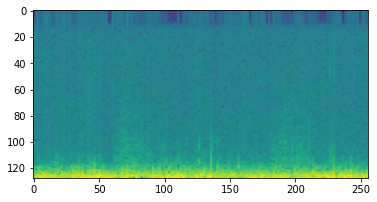

(128, 256)
(128, 256, 1)
Test 105
Predicted image


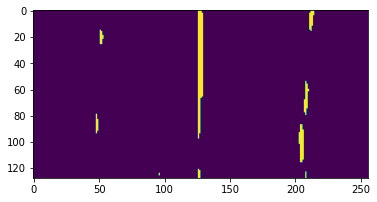

True image


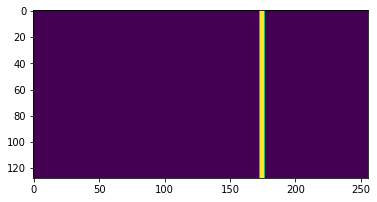

Pattern image


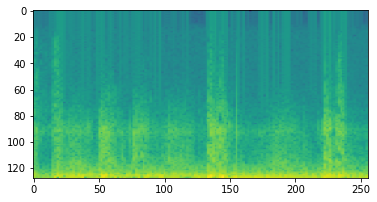

(128, 256)
(128, 256, 1)
Test 106
Predicted image


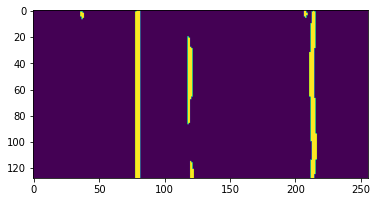

True image


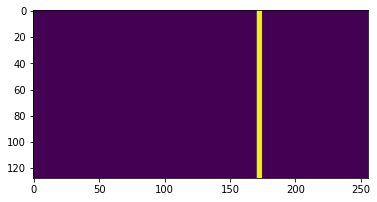

Pattern image


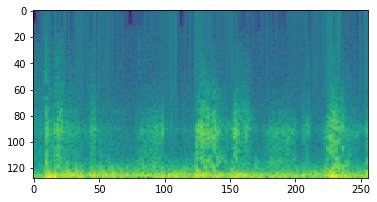

(128, 256)
(128, 256, 1)
Test 107
Predicted image


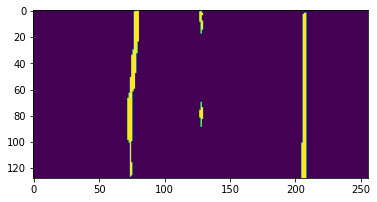

True image


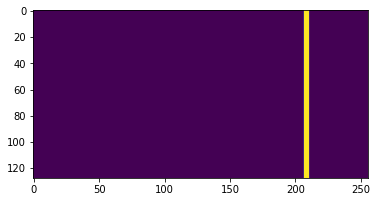

Pattern image


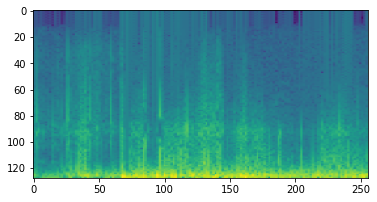

(128, 256)
(128, 256, 1)
Test 108
Predicted image


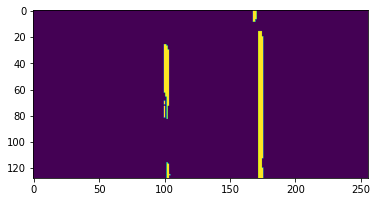

True image


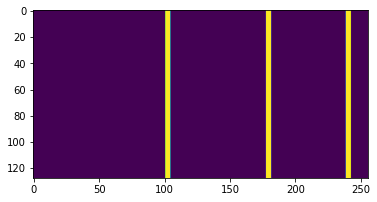

Pattern image


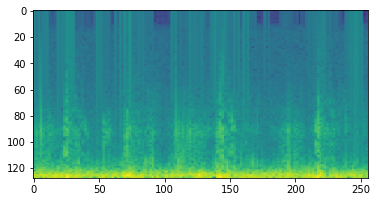

(128, 256)
(128, 256, 1)
Test 109
Predicted image


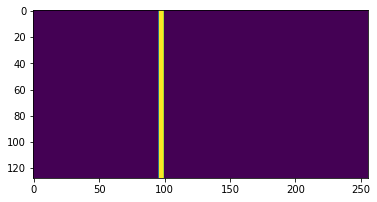

True image


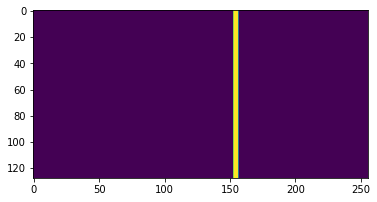

Pattern image


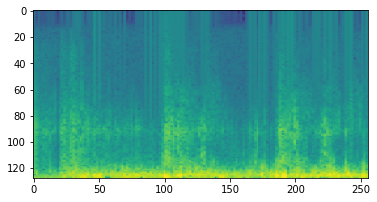

(128, 256)
(128, 256, 1)
Test 110
Predicted image


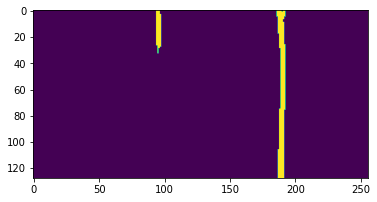

True image


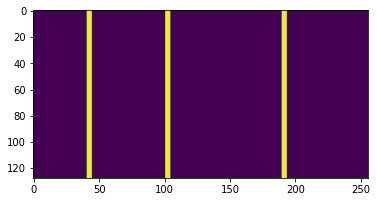

Pattern image


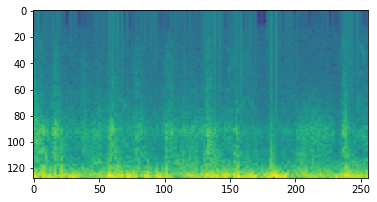

(128, 256)
(128, 256, 1)
Test 111
Predicted image


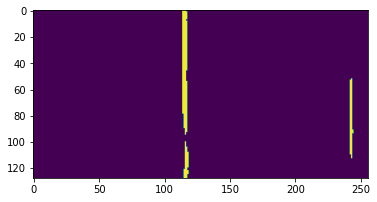

True image


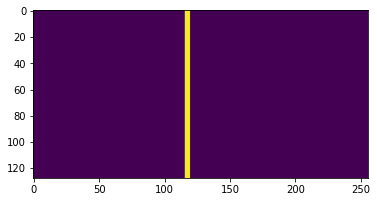

Pattern image


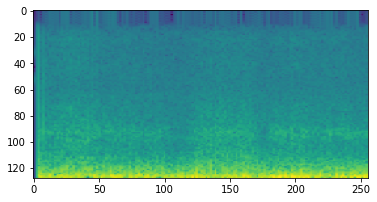

(128, 256)
(128, 256, 1)
Test 112
Predicted image


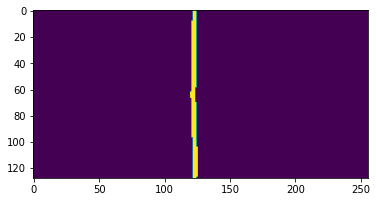

True image


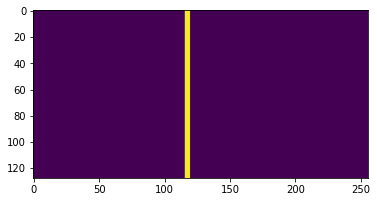

Pattern image


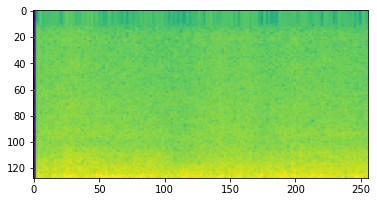

(128, 256)
(128, 256, 1)
Test 113
Predicted image


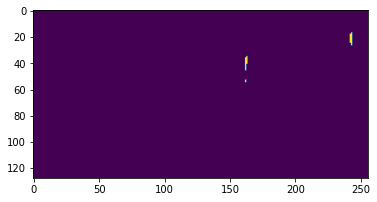

True image


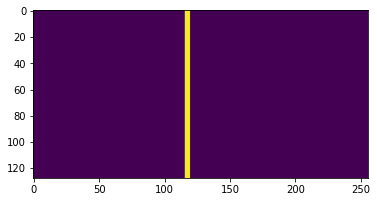

Pattern image


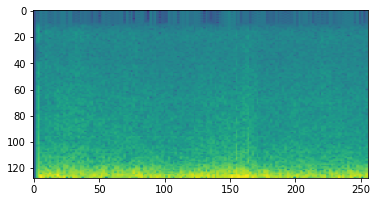

(128, 256)
(128, 256, 1)
Test 114
Predicted image


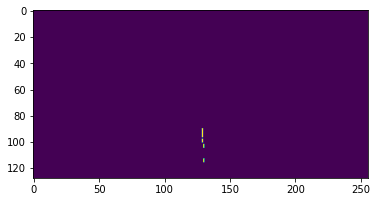

True image


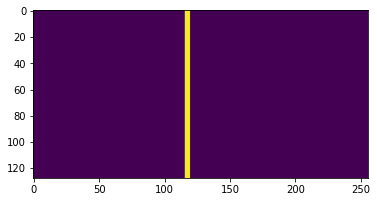

Pattern image


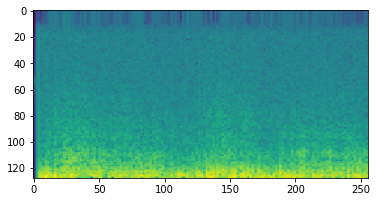

(128, 256)
(128, 256, 1)
Test 115
Predicted image


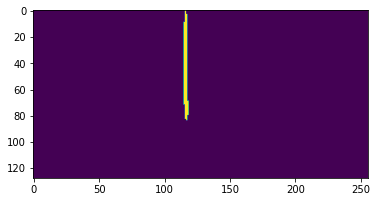

True image


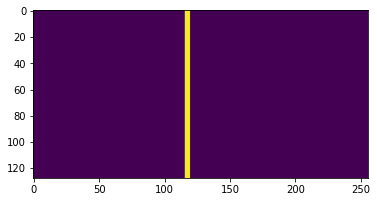

Pattern image


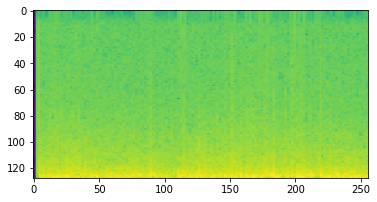

(128, 256)
(128, 256, 1)
Test 116
Predicted image


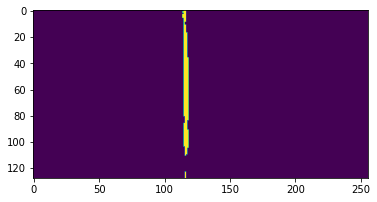

True image


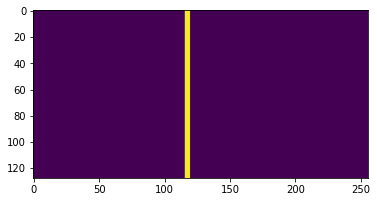

Pattern image


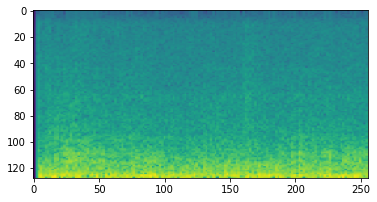

(128, 256)
(128, 256, 1)
Test 117
Predicted image


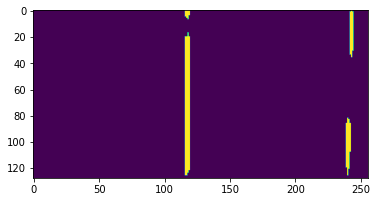

True image


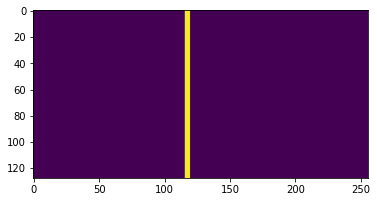

Pattern image


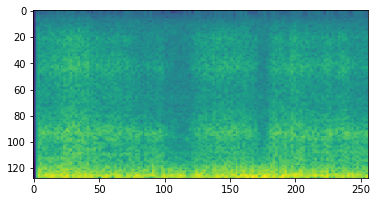

(128, 256)
(128, 256, 1)
Test 118
Predicted image


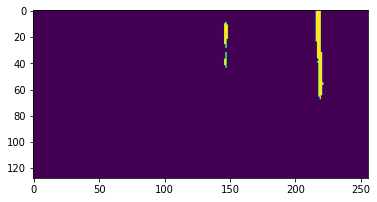

True image


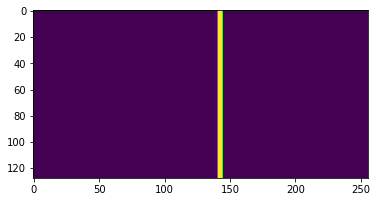

Pattern image


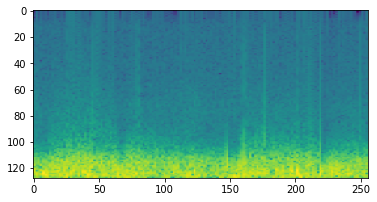

(128, 256)
(128, 256, 1)
Test 119
Predicted image


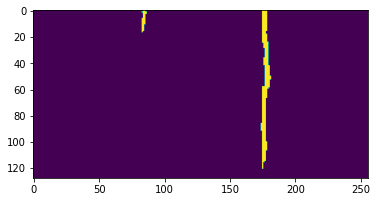

True image


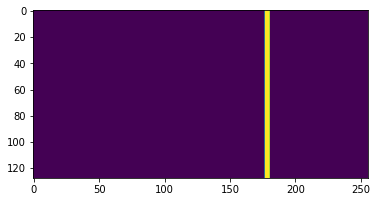

Pattern image


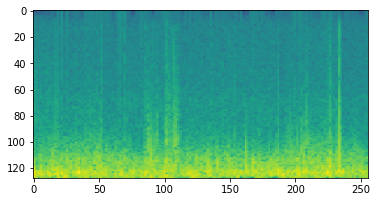

(128, 256)
(128, 256, 1)
Test 120
Predicted image


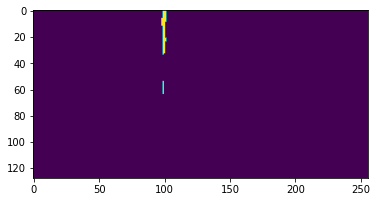

True image


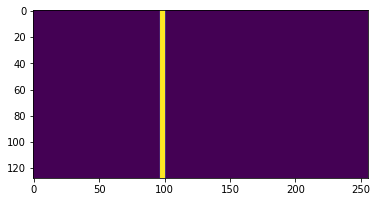

Pattern image


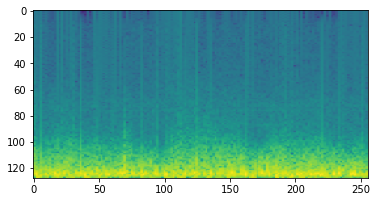

(128, 256)
(128, 256, 1)
Test 121
Predicted image


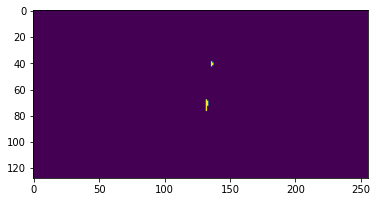

True image


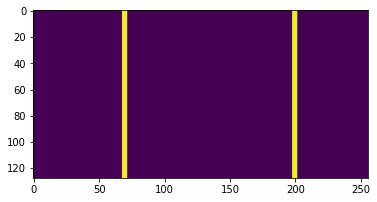

Pattern image


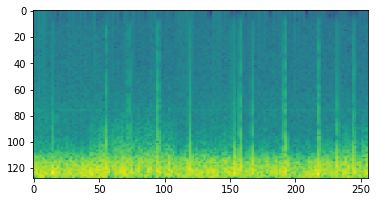

(128, 256)
(128, 256, 1)
Test 122
Predicted image


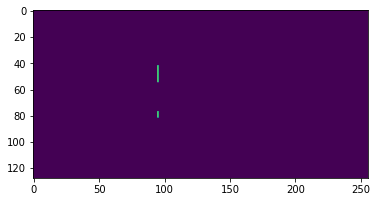

True image


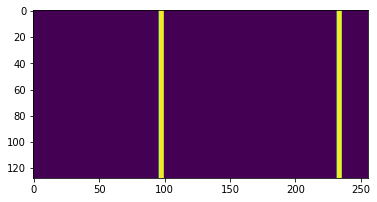

Pattern image


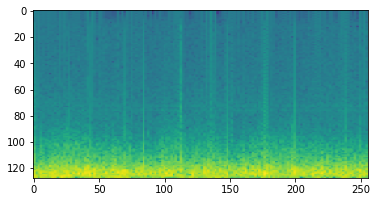

(128, 256)
(128, 256, 1)
Test 123
Predicted image


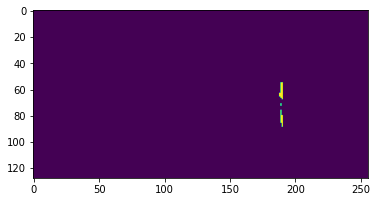

True image


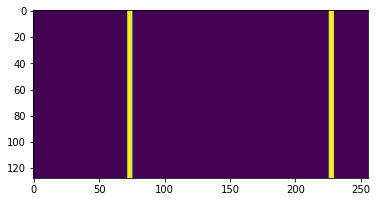

Pattern image


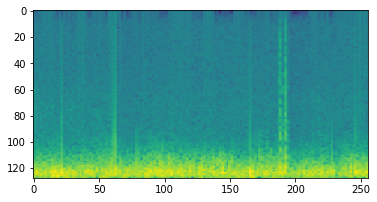

(128, 256)
(128, 256, 1)
Test 124
Predicted image


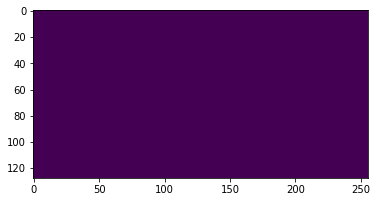

True image


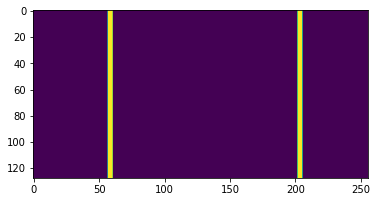

Pattern image


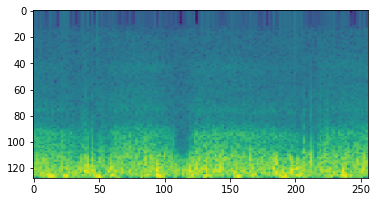

(128, 256)
(128, 256, 1)
Test 125
Predicted image


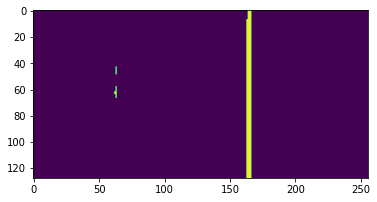

True image


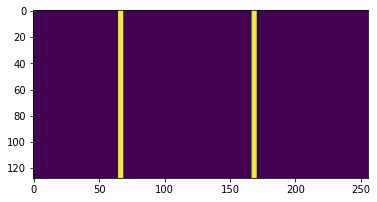

Pattern image


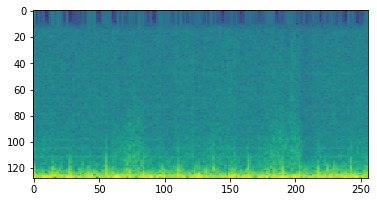

(128, 256)
(128, 256, 1)
Test 126
Predicted image


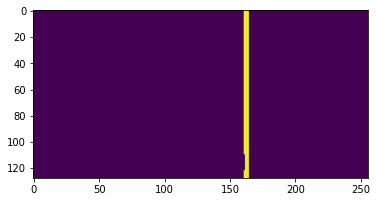

True image


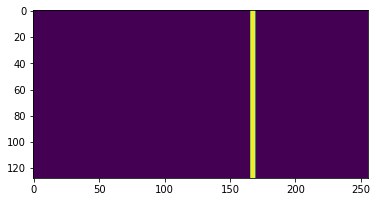

Pattern image


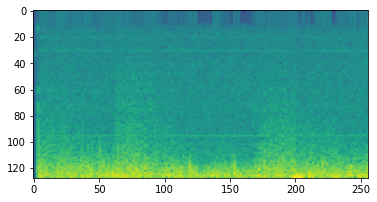

(128, 256)
(128, 256, 1)
Test 127
Predicted image


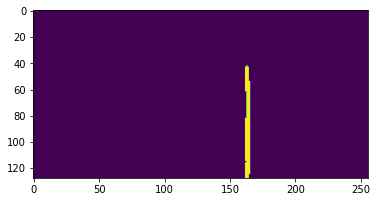

True image


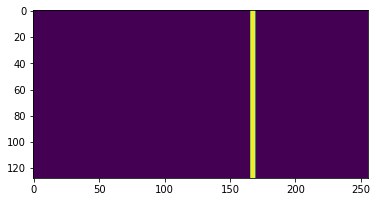

Pattern image


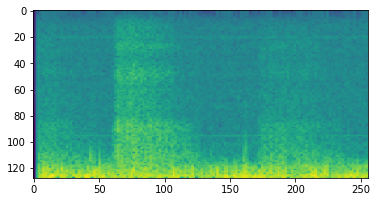

(128, 256)
(128, 256, 1)
Test 128
Predicted image


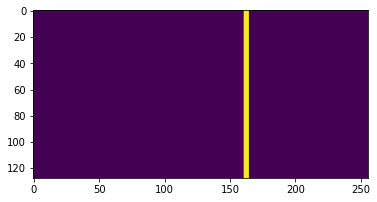

True image


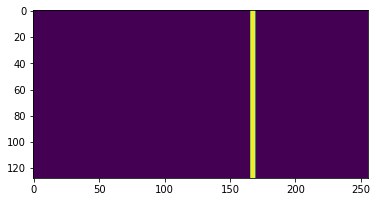

Pattern image


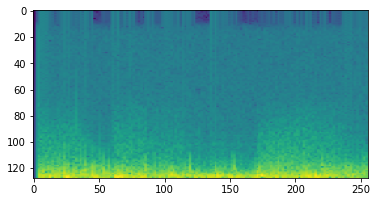

(128, 256)
(128, 256, 1)
Test 129
Predicted image


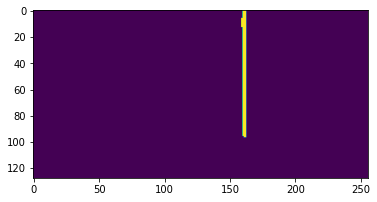

True image


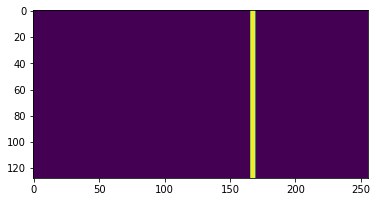

Pattern image


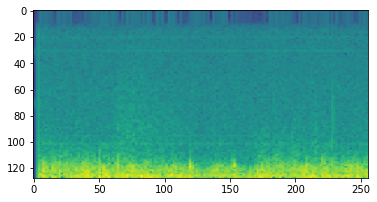

(128, 256)
(128, 256, 1)
Test 130
Predicted image


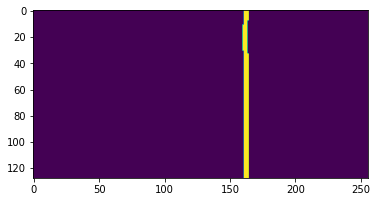

True image


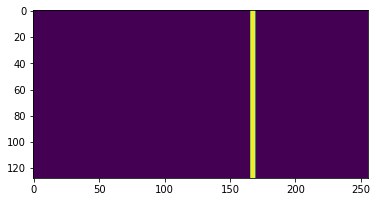

Pattern image


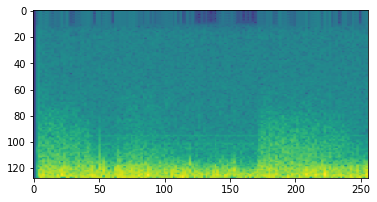

(128, 256)
(128, 256, 1)
Test 131
Predicted image


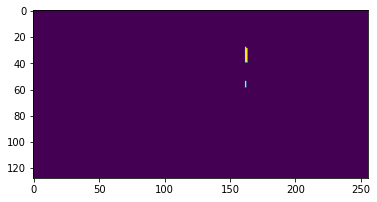

True image


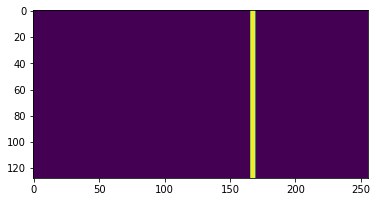

Pattern image


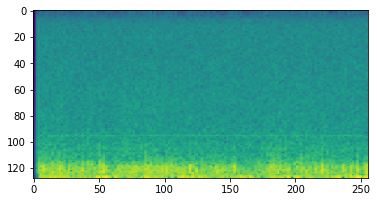

(128, 256)
(128, 256, 1)
Test 132
Predicted image


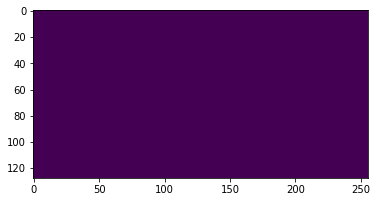

True image


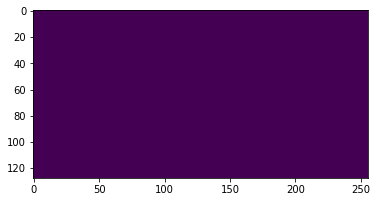

Pattern image


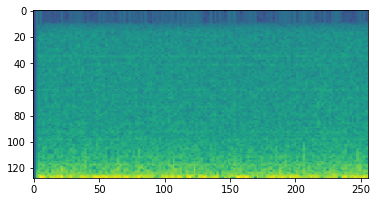

(128, 256)
(128, 256, 1)
Test 133
Predicted image


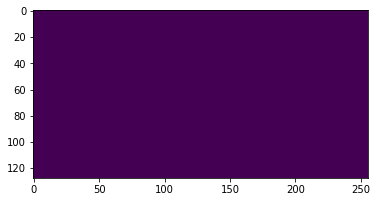

True image


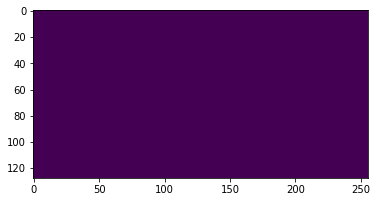

Pattern image


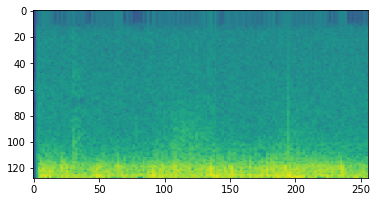

(128, 256)
(128, 256, 1)
Test 134
Predicted image


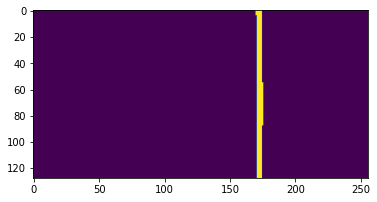

True image


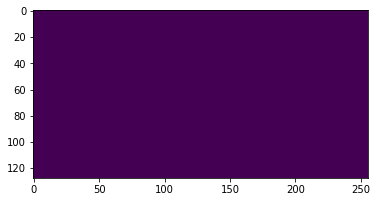

Pattern image


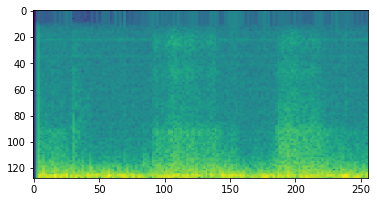

(128, 256)
(128, 256, 1)
Test 135
Predicted image


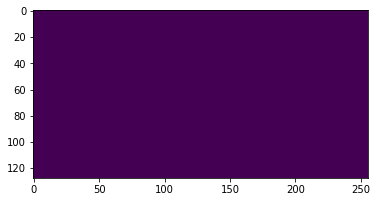

True image


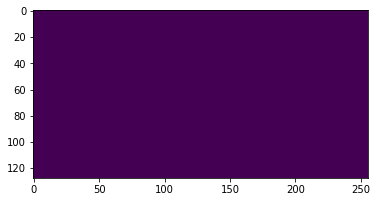

Pattern image


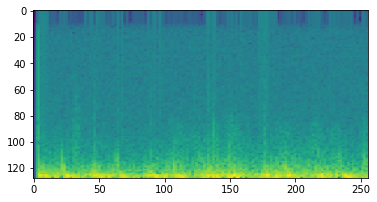

(128, 256)
(128, 256, 1)
Test 136
Predicted image


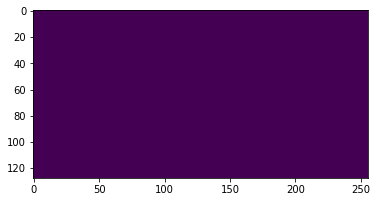

True image


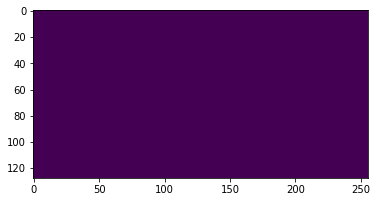

Pattern image


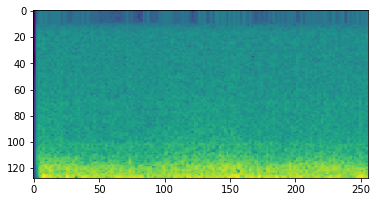

(128, 256)
(128, 256, 1)
Test 137
Predicted image


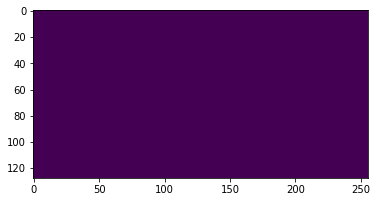

True image


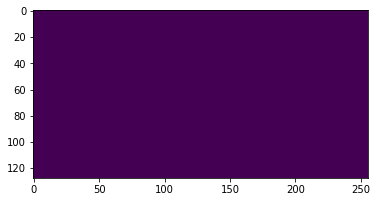

Pattern image


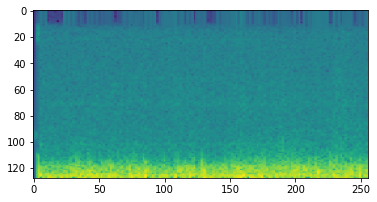

(128, 256)
(128, 256, 1)
Test 138
Predicted image


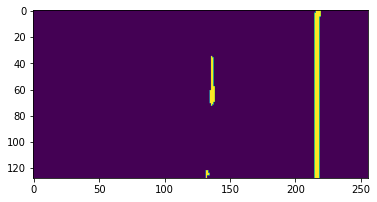

True image


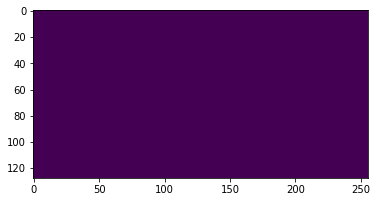

Pattern image


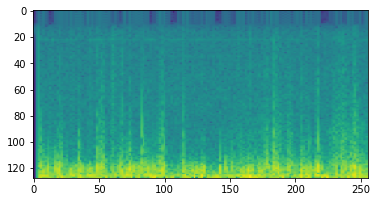

(128, 256)
(128, 256, 1)
Test 139
Predicted image


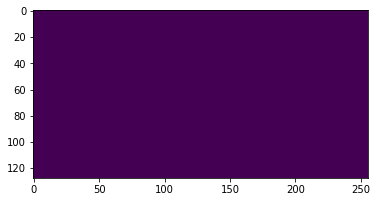

True image


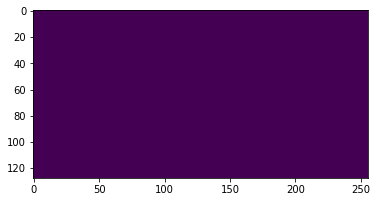

Pattern image


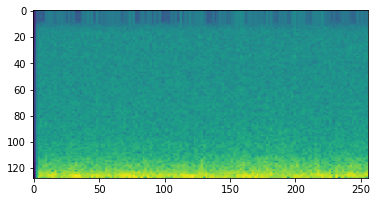

(128, 256)
(128, 256, 1)
Test 140
Predicted image


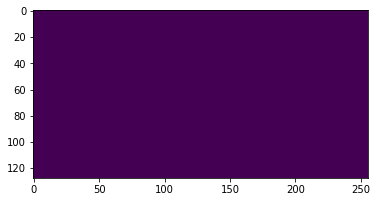

True image


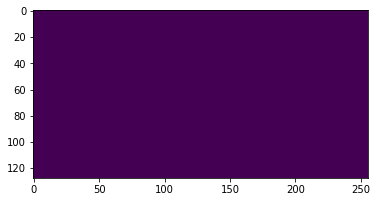

Pattern image


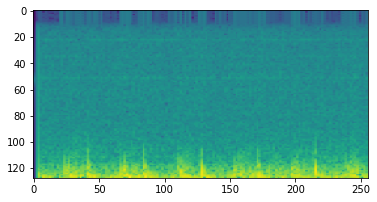

(128, 256)
(128, 256, 1)
Test 141
Predicted image


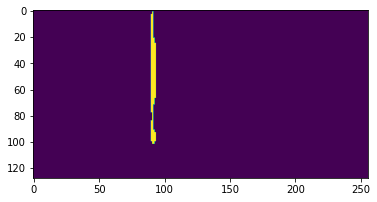

True image


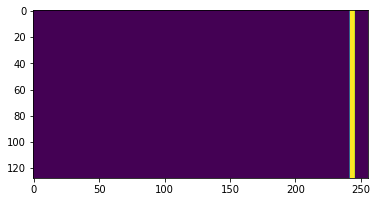

Pattern image


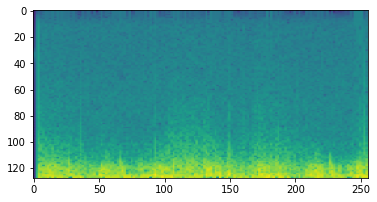

(128, 256)
(128, 256, 1)
Test 142
Predicted image


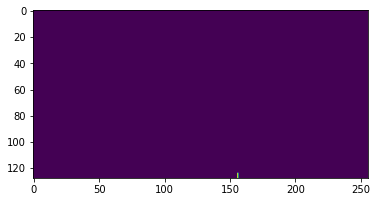

True image


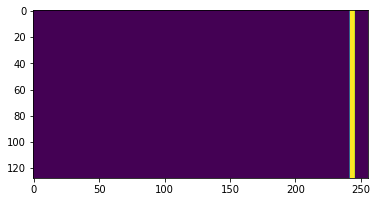

Pattern image


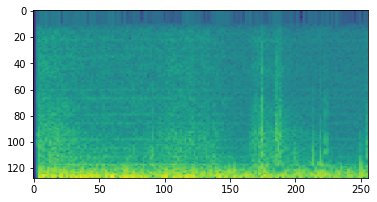

(128, 256)
(128, 256, 1)
Test 143
Predicted image


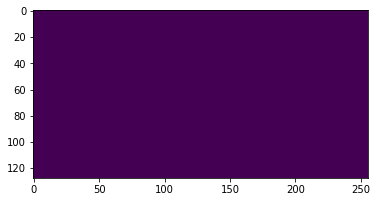

True image


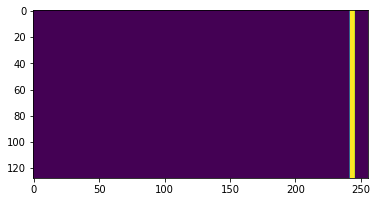

Pattern image


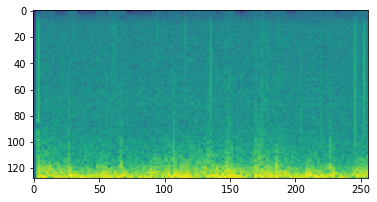

(128, 256)
(128, 256, 1)
Test 144
Predicted image


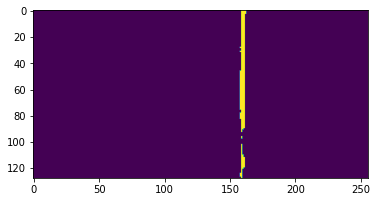

True image


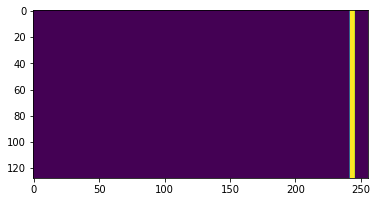

Pattern image


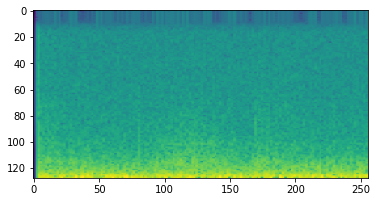

(128, 256)
(128, 256, 1)
Test 145
Predicted image


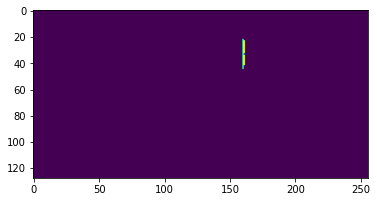

True image


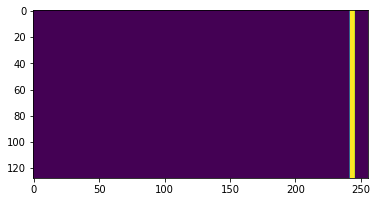

Pattern image


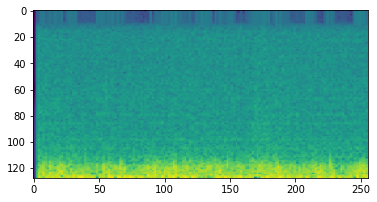

(128, 256)
(128, 256, 1)
Test 146
Predicted image


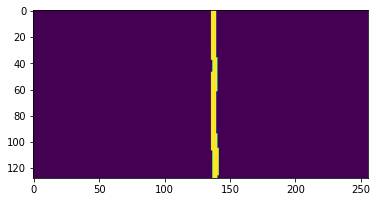

True image


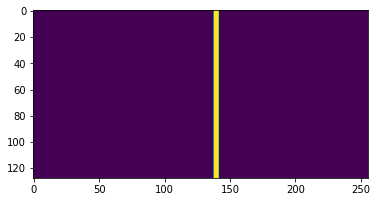

Pattern image


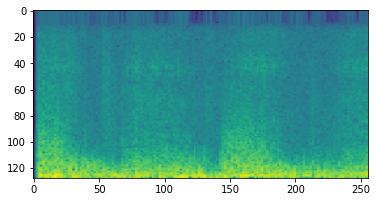

(128, 256)
(128, 256, 1)
Test 147
Predicted image


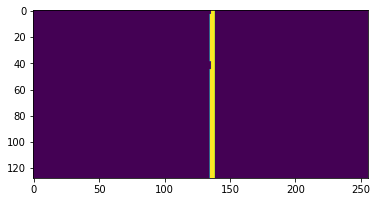

True image


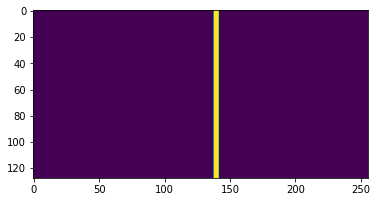

Pattern image


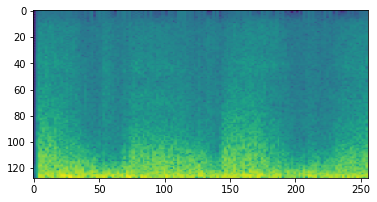

(128, 256)
(128, 256, 1)
Test 148
Predicted image


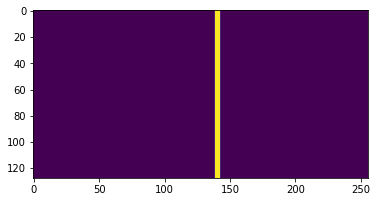

True image


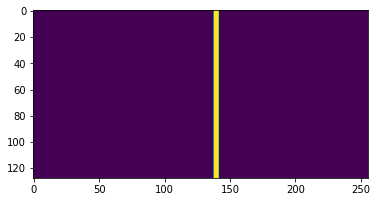

Pattern image


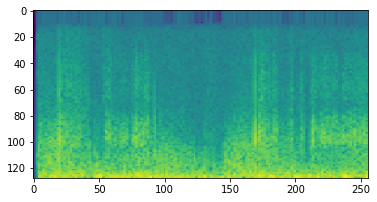

(128, 256)
(128, 256, 1)
Test 149
Predicted image


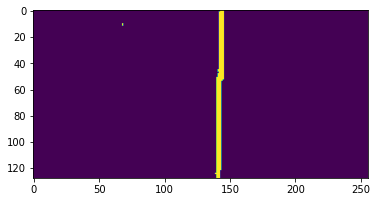

True image


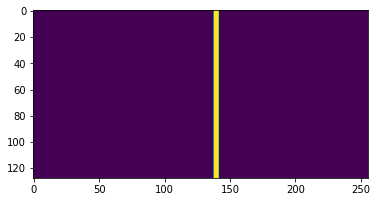

Pattern image


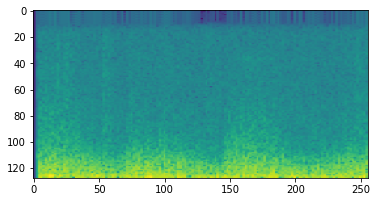

(128, 256)
(128, 256, 1)
Test 150
Predicted image


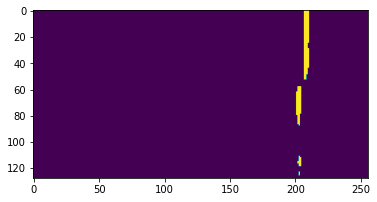

True image


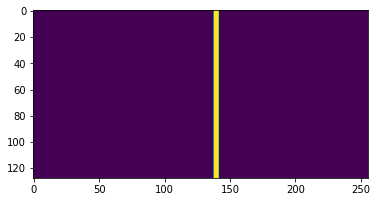

Pattern image


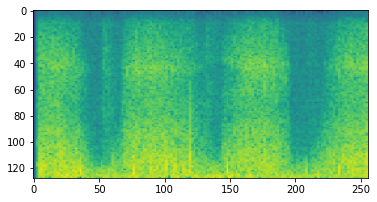

(128, 256)
(128, 256, 1)
Test 151
Predicted image


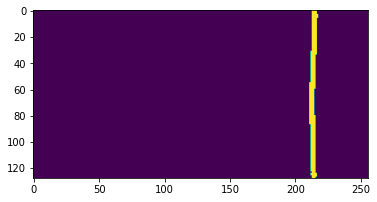

True image


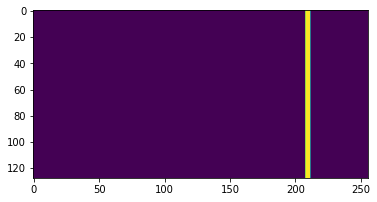

Pattern image


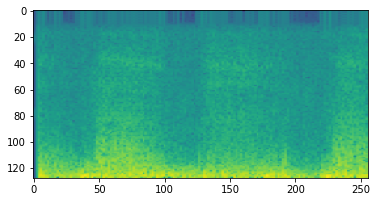

(128, 256)
(128, 256, 1)
Test 152
Predicted image


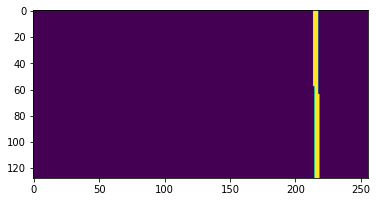

True image


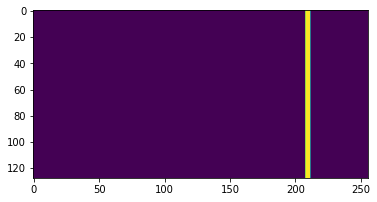

Pattern image


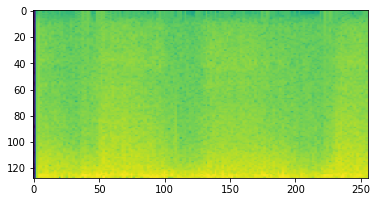

(128, 256)
(128, 256, 1)
Test 153
Predicted image


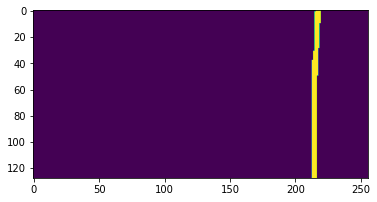

True image


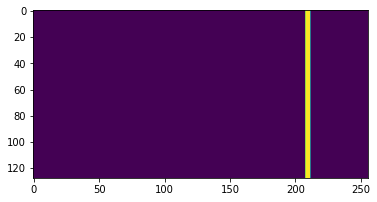

Pattern image


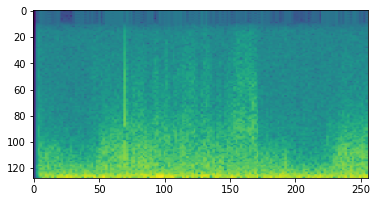

(128, 256)
(128, 256, 1)
Test 154
Predicted image


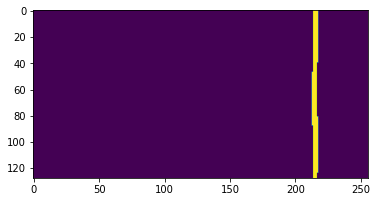

True image


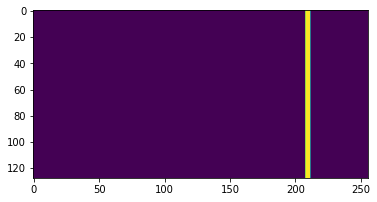

Pattern image


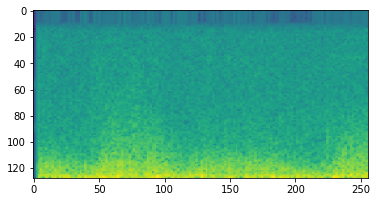

(128, 256)
(128, 256, 1)
Test 155
Predicted image


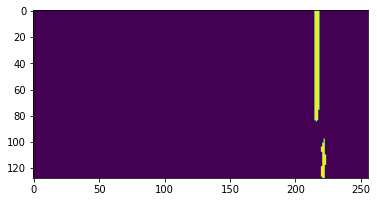

True image


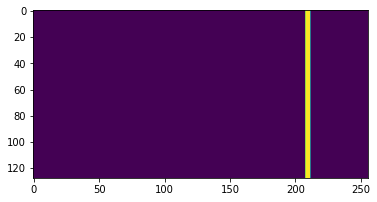

Pattern image


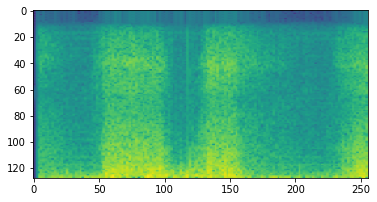

(128, 256)
(128, 256, 1)
Test 156
Predicted image


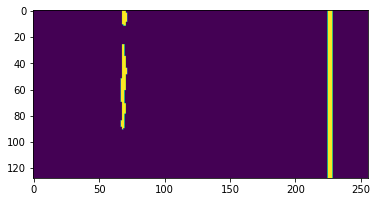

True image


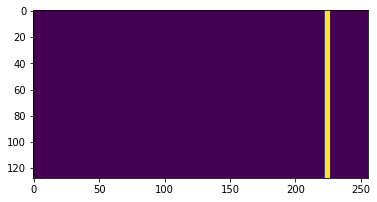

Pattern image


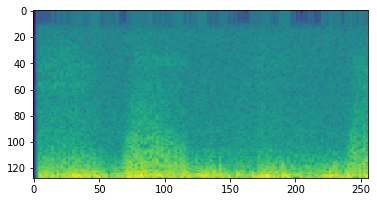

(128, 256)
(128, 256, 1)
Test 157
Predicted image


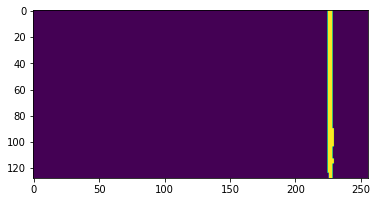

True image


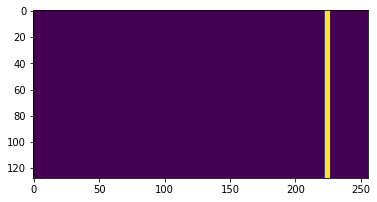

Pattern image


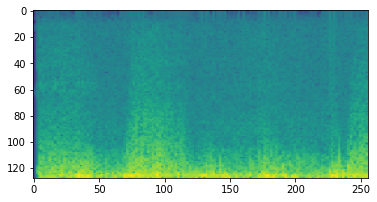

(128, 256)
(128, 256, 1)
Test 158
Predicted image


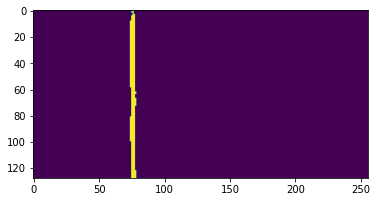

True image


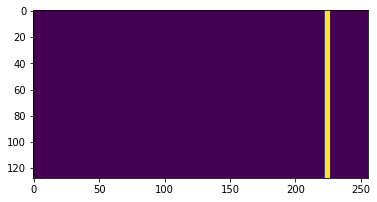

Pattern image


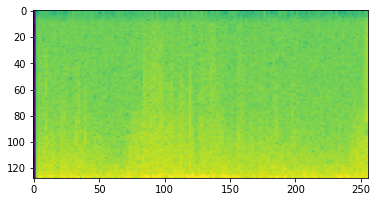

(128, 256)
(128, 256, 1)
Test 159
Predicted image


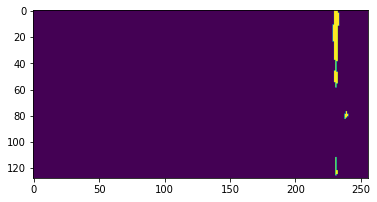

True image


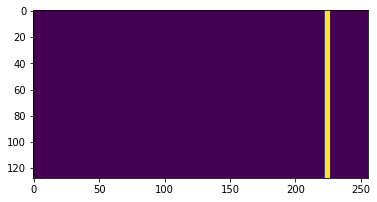

Pattern image


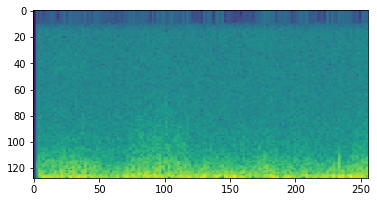

(128, 256)
(128, 256, 1)
Test 160
Predicted image


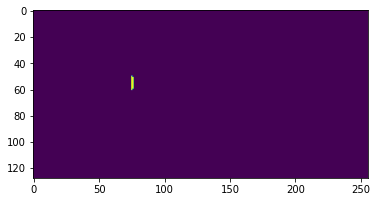

True image


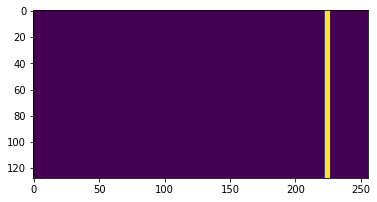

Pattern image


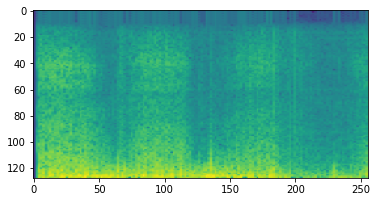

(128, 256)
(128, 256, 1)
Test 161
Predicted image


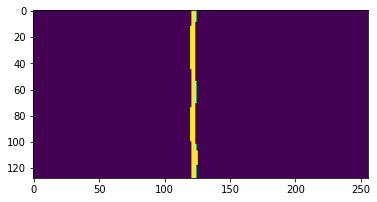

True image


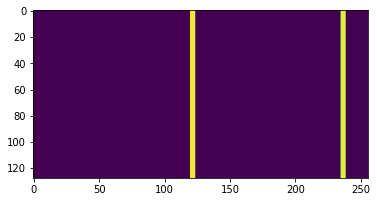

Pattern image


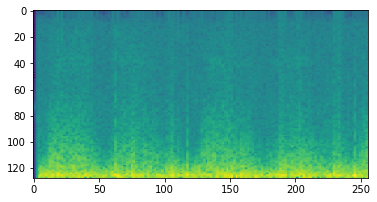

(128, 256)
(128, 256, 1)
Test 162
Predicted image


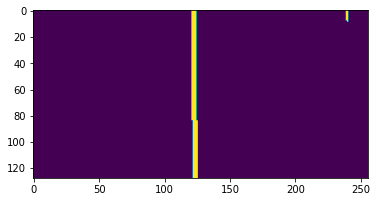

True image


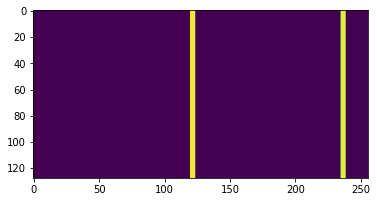

Pattern image


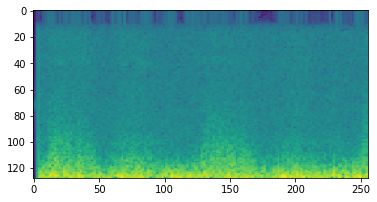

(128, 256)
(128, 256, 1)
Test 163
Predicted image


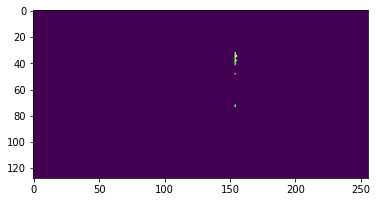

True image


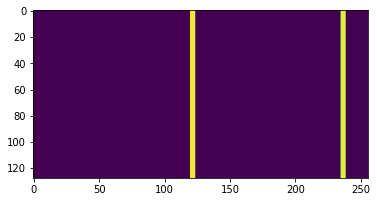

Pattern image


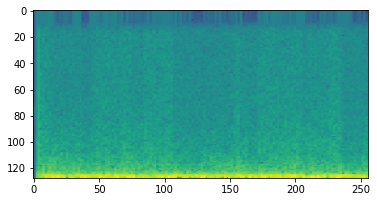

(128, 256)
(128, 256, 1)
Test 164
Predicted image


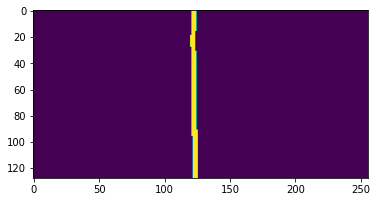

True image


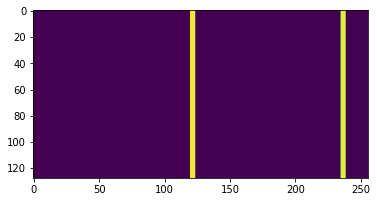

Pattern image


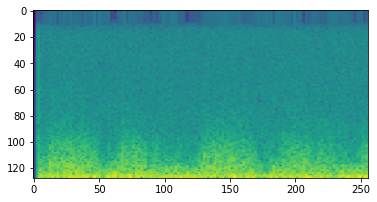

(128, 256)
(128, 256, 1)
Test 165
Predicted image


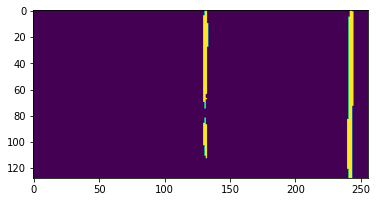

True image


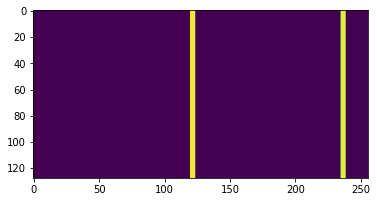

Pattern image


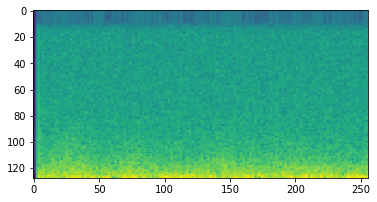

(128, 256)
(128, 256, 1)
Test 166
Predicted image


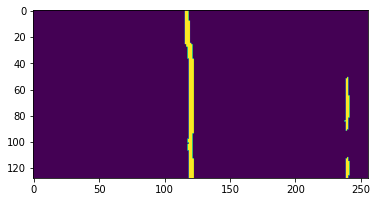

True image


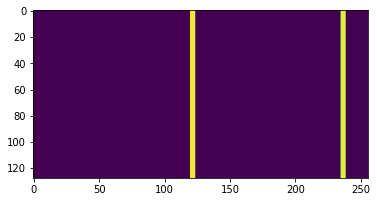

Pattern image


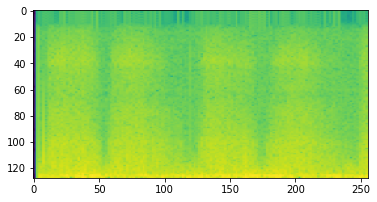

(128, 256)
(128, 256, 1)
Test 167
Predicted image


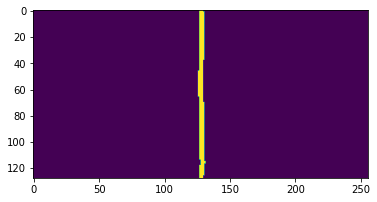

True image


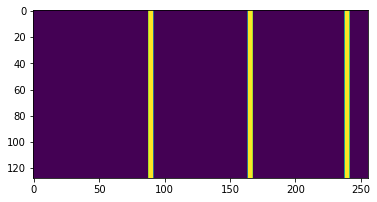

Pattern image


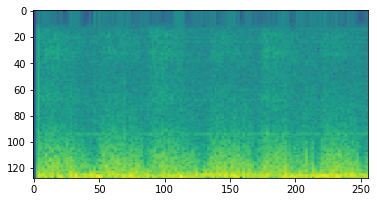

(128, 256)
(128, 256, 1)
Test 168
Predicted image


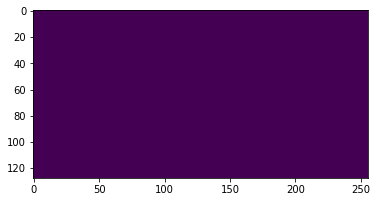

True image


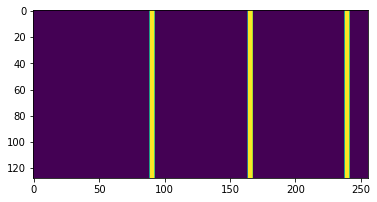

Pattern image


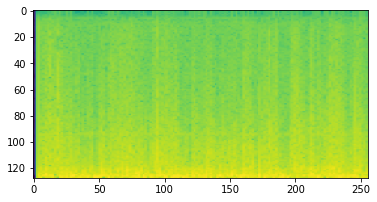

(128, 256)
(128, 256, 1)
Test 169
Predicted image


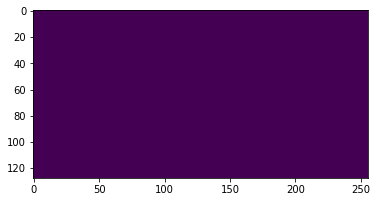

True image


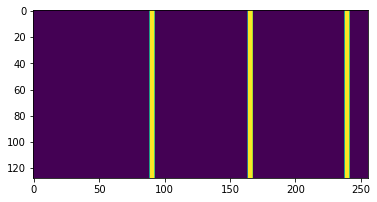

Pattern image


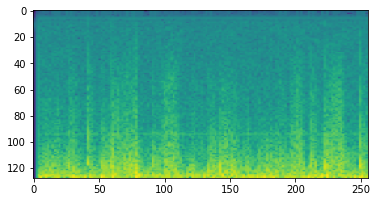

(128, 256)
(128, 256, 1)
Test 170
Predicted image


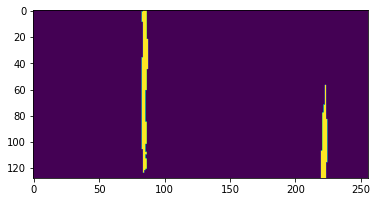

True image


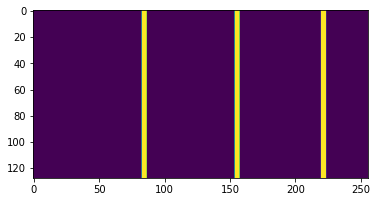

Pattern image


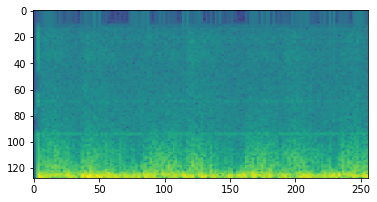

(128, 256)
(128, 256, 1)
Test 171
Predicted image


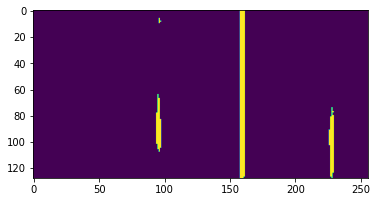

True image


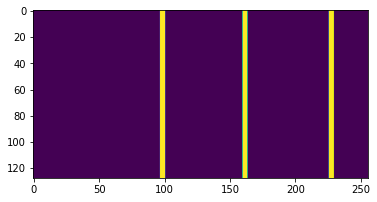

Pattern image


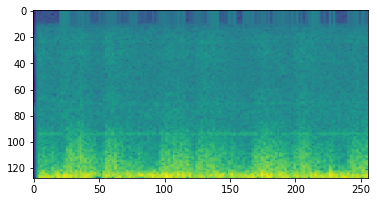

(128, 256)
(128, 256, 1)
Test 172
Predicted image


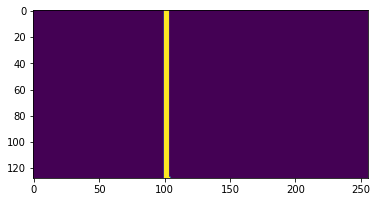

True image


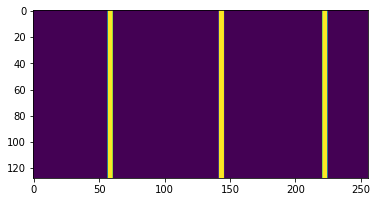

Pattern image


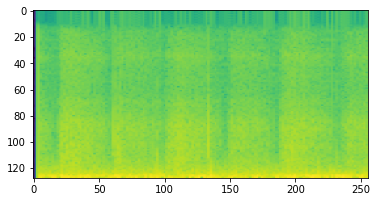

(128, 256)
(128, 256, 1)
Test 173
Predicted image


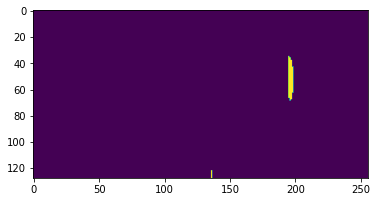

True image


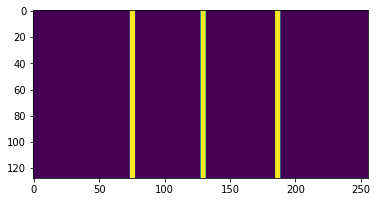

Pattern image


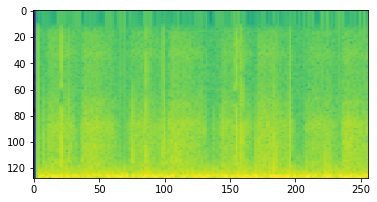

(128, 256)
(128, 256, 1)
Test 174
Predicted image


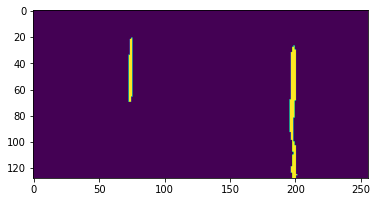

True image


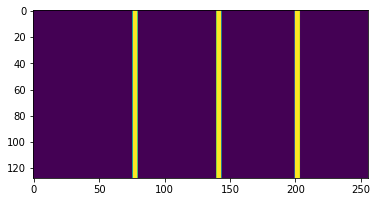

Pattern image


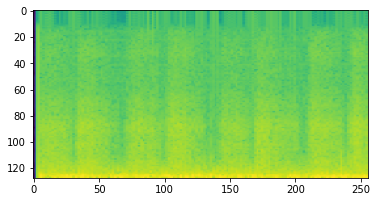

(128, 256)
(128, 256, 1)
Test 175
Predicted image


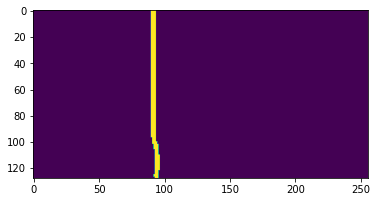

True image


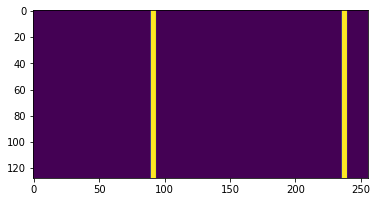

Pattern image


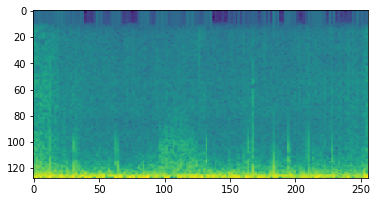

(128, 256)
(128, 256, 1)
Test 176
Predicted image


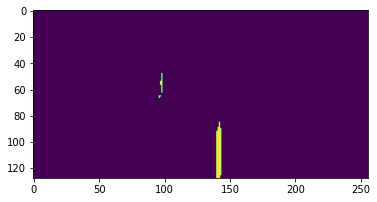

True image


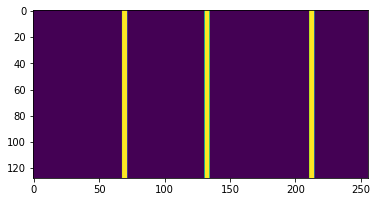

Pattern image


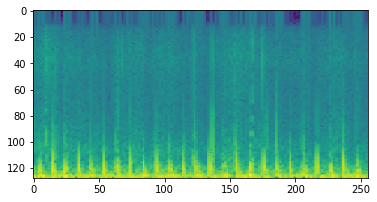

(128, 256)
(128, 256, 1)
Test 177
Predicted image


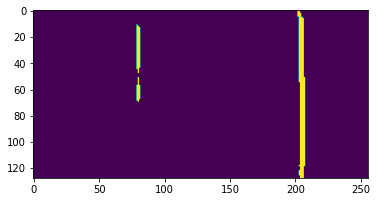

True image


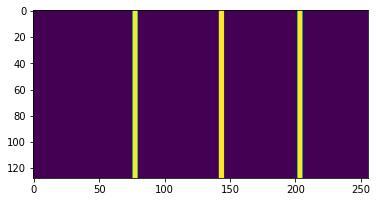

Pattern image


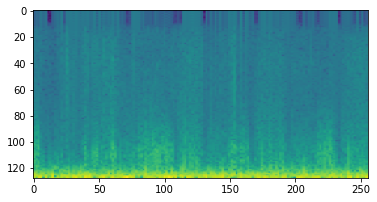

(128, 256)
(128, 256, 1)
Test 178
Predicted image


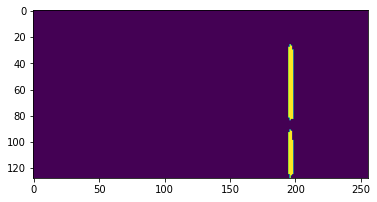

True image


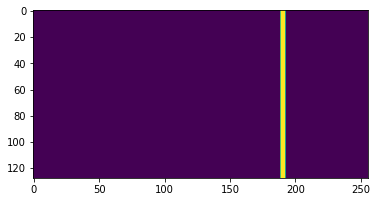

Pattern image


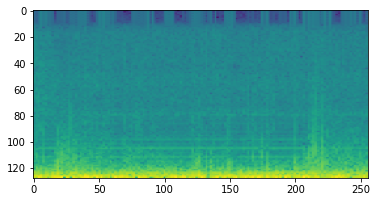

(128, 256)
(128, 256, 1)
Test 179
Predicted image


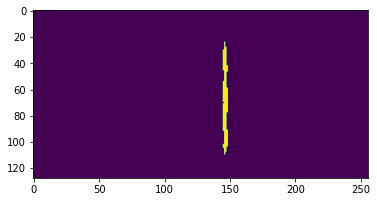

True image


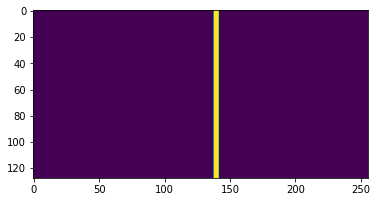

Pattern image


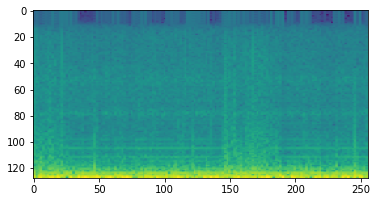

(128, 256)
(128, 256, 1)
Test 180
Predicted image


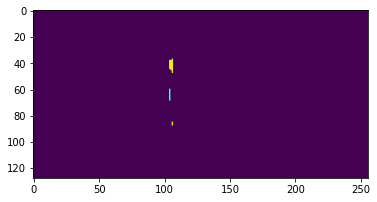

True image


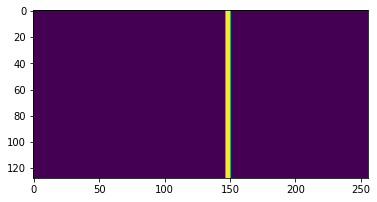

Pattern image


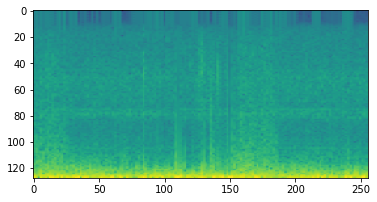

(128, 256)
(128, 256, 1)
Test 181
Predicted image


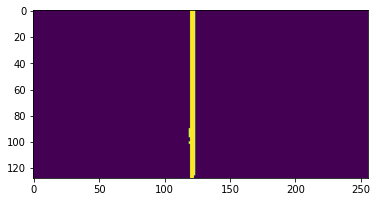

True image


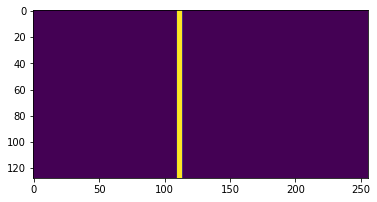

Pattern image


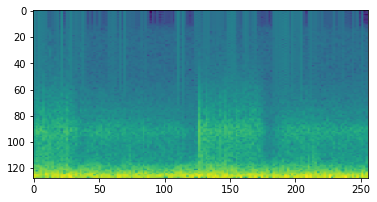

(128, 256)
(128, 256, 1)
Test 182
Predicted image


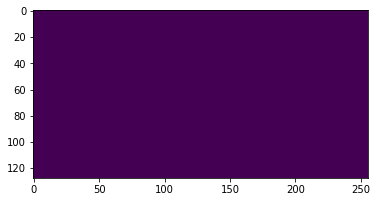

True image


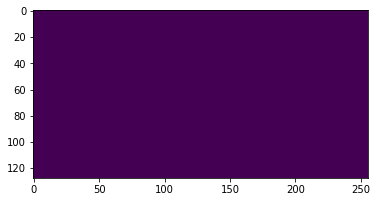

Pattern image


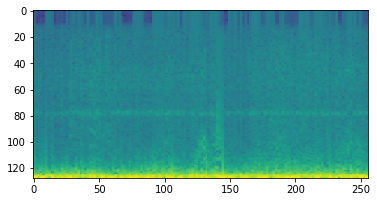

(128, 256)
(128, 256, 1)
Test 183
Predicted image


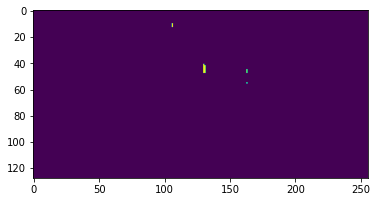

True image


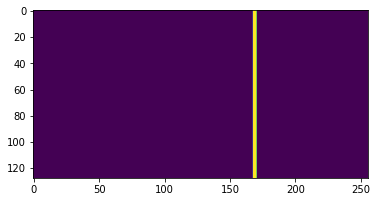

Pattern image


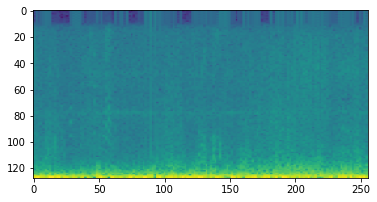

(128, 256)
(128, 256, 1)
Test 184
Predicted image


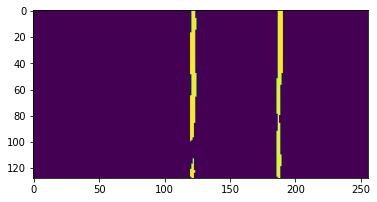

True image


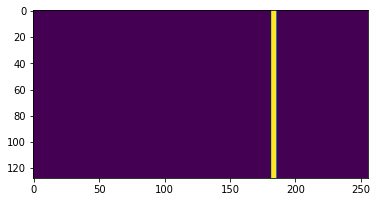

Pattern image


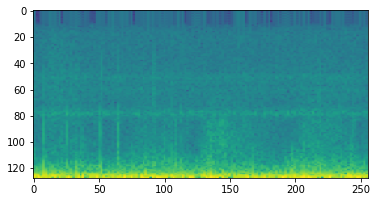

(128, 256)
(128, 256, 1)
Test 185
Predicted image


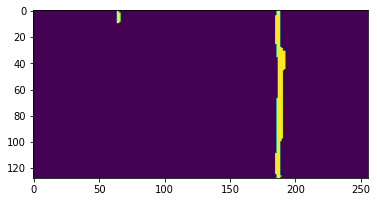

True image


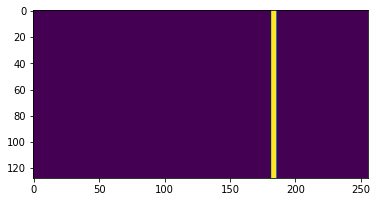

Pattern image


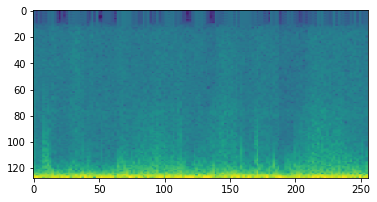

(128, 256)
(128, 256, 1)
Test 186
Predicted image


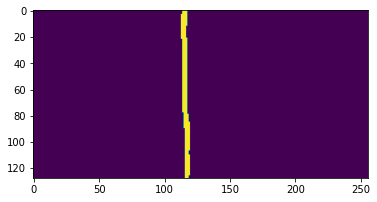

True image


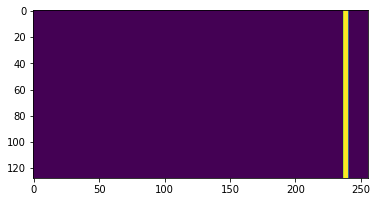

Pattern image


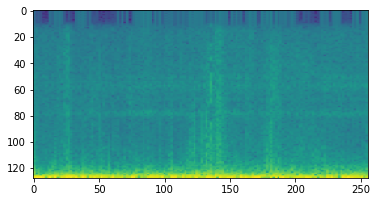

(128, 256)
(128, 256, 1)
Test 187
Predicted image


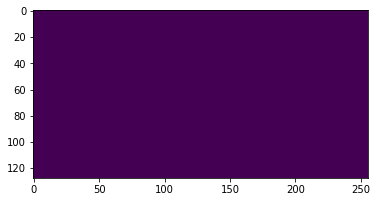

True image


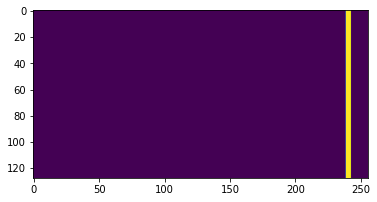

Pattern image


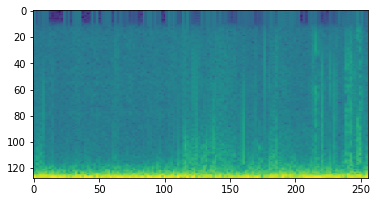

(128, 256)
(128, 256, 1)
Test 188
Predicted image


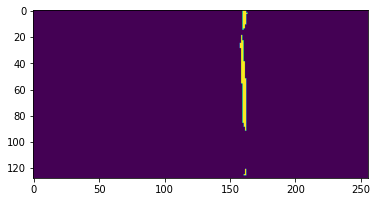

True image


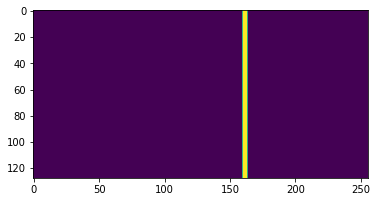

Pattern image


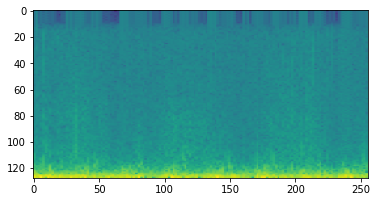

(128, 256)
(128, 256, 1)
Test 189
Predicted image


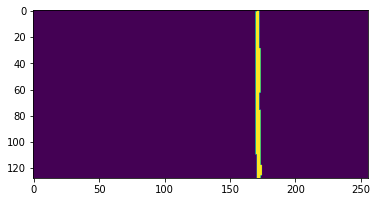

True image


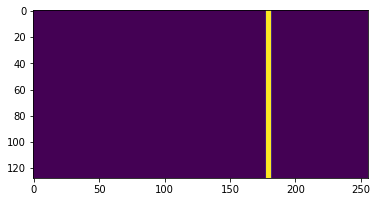

Pattern image


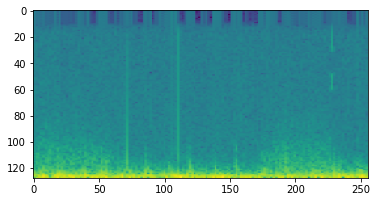

(128, 256)
(128, 256, 1)
Test 190
Predicted image


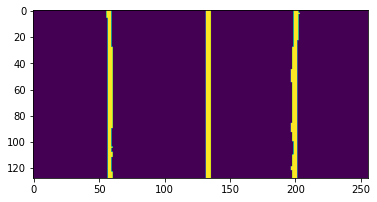

True image


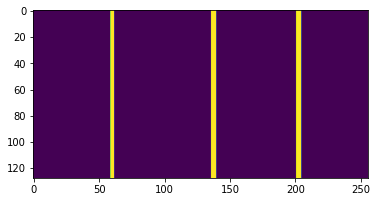

Pattern image


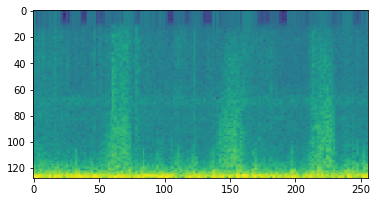

In [0]:
import matplotlib.pyplot as plt
from collections import Counter
print(test_preds.max())
print(test_preds.min())

thresh = 0.7


'''
predictions = np.zeros((y_test.shape[0],128,256))
for j in range(len(predictions)):
  temp = test_preds[j]
  print(temp.shape)
  idx = np.where(temp >= thresh)
  u, c = np.unique(idx, return_counts=True)
  items = u[c > 70]
  predictions[j,:,u] = 1.0 
  print(items)
'''
preds_test_thresh = (test_preds >= thresh).astype(np.uint8)


y_test_tresh = (y_test >= thresh).astype(np.uint8)

for j in range(len(preds_test_thresh)):
  tp = preds_test_thresh[j]

  #tp = tp.reshape(tp.shape[1],tp.shape[2],1)
  tp = tp[:,:,0]

  print(tp.shape)
  #tp = cv2.cvtColor(tp, cv2.COLOR_GRAY2RGB)

  #tp = cv2.resize(tp,(128,256)) 
  
  tt = y_test_tresh[j]
  print(tt.shape)
  #tt = cv2.cvtColor(tt, cv2.COLOR_GRAY2RGB)

  tt = cv2.resize(tt,(256,128))
  #tt = cv2.cvtColor(tt, cv2.COLOR_BGR2GRAY)
  print('Test '+str(j))
  print('Predicted image')
  plt.imshow(tp)
  plt.show()
  plt.close()
  print('True image')

  plt.imshow(tt)
  plt.show()
  plt.close()
  print('Pattern image')
  t2 = test2[j]
  plt.imshow(t2)
  plt.show()
  plt.close()

In [0]:
print(extracted[0].shape)

print(masks[0].shape)
extracted = np.reshape(extracted, (*extracted.shape,1)) 
print(extracted.shape)

(20000,)
(20000, 1)
(538, 20000, 1)
